# **Predicting YouTube Views**


## Problem Statement

A problem that content creators and organizations face is gaining viewer attention in a highly saturated digital landscape. Each popular app or service is competing for attention. Because of this, more aggressive marketing campaigns and content creation strategies are needed to gain more viewership and engagement.

YouTube has approximately 122 million daily active users with 2.70 billion monthly active YouTube users worldwide (GMI Blogger, 2024). This large user base makes YouTube a highly effective tool for content creators to reach viewers and potential subscribers.

The goal of this project is to analyze what attributes of a video affect how popular that video will be and predict the approximate number of views a new video will get in the long run by training a machine learning model to recognize the features that contribute to high viewership on trending video metadata.

By being able to predict the potential view count for a new video, content creators can optimize their videos to maximize the views and engagement.


## Project Setup

In [27]:
# Needed for importing target encoder, restart after running
!pip install --upgrade scikit-learn

In [28]:
!pip install vaderSentiment

In [29]:
!pip install transformers

In [30]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import json
import re
import os
import string
import nltk
import google_auth_oauthlib.flow
import googleapiclient.discovery
import googleapiclient.errors
import warnings
from datetime import datetime
from google.colab import userdata
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.tree import plot_tree, DecisionTreeRegressor
from sklearn.preprocessing import TargetEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from transformers import BertTokenizer, TFBertModel
from sklearn.dummy import DummyRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from wordcloud import WordCloud
from nltk.corpus import stopwords
from collections import Counter
from sklearn.utils import resample
from sklearn.preprocessing import KBinsDiscretizer
from scipy.stats import ks_2samp

pd.set_option("display.max_colwidth", 100)
nltk.download('stopwords')
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [31]:
# Load data from github
!wget https://raw.githubusercontent.com/julietlawton/youtube-views-prediction/main/youtube-dataset/US_category_id.json
!wget https://raw.githubusercontent.com/julietlawton/youtube-views-prediction/main/youtube-dataset/USvideos.csv

--2024-06-24 20:50:31--  https://raw.githubusercontent.com/julietlawton/youtube-views-prediction/main/youtube-dataset/US_category_id.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8496 (8.3K) [text/plain]
Saving to: ‘US_category_id.json.1’

US_category_id.json 100%[===================>]   8.30K  --.-KB/s    in 0s      

2024-06-24 20:50:31 (89.6 MB/s) - ‘US_category_id.json.1’ saved [8496/8496]

--2024-06-24 20:50:31--  https://raw.githubusercontent.com/julietlawton/youtube-views-prediction/main/youtube-dataset/USvideos.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP re

In [32]:
# Helper function that supresses scientific notation when printing an array
def print_full_array(array):
  np.set_printoptions(formatter={'float': '{: 0.3f}'.format})
  print(array)

## Data Preparation

The data we used for this project is the Trending YouTube Video Statistics dataset from Kaggle. The dataset is composed of a collection of videos that trended on the platform in the U.S. between January 2017 to May 2018 and their metadata, such as the category of the video, when it was uploaded, the title of the video and its description. The dataset contains 40,949 entries, with each video appearing as a separate entry for every day that it trended. All variables had no missing values except for the descriptions, which were missing 98 values. A separate JSON file holds the category names for each category id, so after loading the data we used this file to replace the category ids with their names to make analysis easier and avoid creating an ordinal representation of the categories could be misinterpreted by a machine learning model. We dropped all variables that would not be useful for this use case - the trending date, channel title, likes, dislikes, comment count, tags, thumbnail link, and video error or removed flag. We temporarily kept the category ids to use in the correlation matrix we created later. We could have kept the tags but decided against it because they predominantly consist of pop culture words that would likely not be recognized by any NLP model or language model we would end up using to extract features from the text variables. Channel title was not useful because it does not generalize to creators who are not represented in this dataset, and likes, dislikes, comment count, and video error or removed flag were not useful because the model would not have access to this information at the time a new video is posted.

In [33]:
# Read data into dataframe
youtube_df = pd.read_csv('USvideos.csv')

In [34]:
# Extract video category labels and ids from auxillary JSON file
with open("US_category_id.json", "r") as f:
    data = json.load(f)

# Create a dictionary mapping ids to lablels
categories = {}
for item in data['items']:
    id = int(item['id'])
    category = item['snippet']['title']
    categories[id] = category

print(categories)

{1: 'Film & Animation', 2: 'Autos & Vehicles', 10: 'Music', 15: 'Pets & Animals', 17: 'Sports', 18: 'Short Movies', 19: 'Travel & Events', 20: 'Gaming', 21: 'Videoblogging', 22: 'People & Blogs', 23: 'Comedy', 24: 'Entertainment', 25: 'News & Politics', 26: 'Howto & Style', 27: 'Education', 28: 'Science & Technology', 29: 'Nonprofits & Activism', 30: 'Movies', 31: 'Anime/Animation', 32: 'Action/Adventure', 33: 'Classics', 34: 'Comedy', 35: 'Documentary', 36: 'Drama', 37: 'Family', 38: 'Foreign', 39: 'Horror', 40: 'Sci-Fi/Fantasy', 41: 'Thriller', 42: 'Shorts', 43: 'Shows', 44: 'Trailers'}


In [35]:
# Add category labels for each video
youtube_df['category_label'] = youtube_df['category_id'].apply(lambda x: categories[x])

In [36]:
# Display counts for each variable
display(youtube_df.info(verbose=True, show_counts=True))

# Display first 5 entries
youtube_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                40949 non-null  object
 1   trending_date           40949 non-null  object
 2   title                   40949 non-null  object
 3   channel_title           40949 non-null  object
 4   category_id             40949 non-null  int64 
 5   publish_time            40949 non-null  object
 6   tags                    40949 non-null  object
 7   views                   40949 non-null  int64 
 8   likes                   40949 non-null  int64 
 9   dislikes                40949 non-null  int64 
 10  comment_count           40949 non-null  int64 
 11  thumbnail_link          40949 non-null  object
 12  comments_disabled       40949 non-null  bool  
 13  ratings_disabled        40949 non-null  bool  
 14  video_error_or_removed  40949 non-null  bool  
 15  de

None

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_label
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/shantellmartin\nCANDICE - https://www.lovebilly.com...,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with John Oliver (HBO),LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week tonight donald trump""|""john oliver trump""|""donald ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John Oliver discusses what we've learned so far and en...",Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""|""racist""|""superman""|""love""|""rudy mancuso poo bear...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► https://www.youtube.com/channel/UC5jkXpfnBhlDjqh0ir5Fs...,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""rhett and link good mythical morning""|""good mythic...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amateur or a secret Nickelback devotee. GMM #1218\nDon...,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""idy""|""rhpc""|""dares""|""no truth""|""comments""|""comedy""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,"I know it's been a while since we did this show, but we're back with what might be the best epis...",Entertainment


In [37]:
# View trending date range
print(f"{youtube_df['trending_date'].min()} - {youtube_df['trending_date'].max()}")

17.01.12 - 18.31.05


In [38]:
# Drop columns that we won't use
# Leave the category id in for now to use in the correlation matrix
youtube_df.drop([
    'trending_date',
    'channel_title',
    'likes',
    'dislikes',
    'comment_count',
    'tags',
    'thumbnail_link',
    'video_error_or_removed'], axis=1, inplace=True)

## Feature Engineering and Data Preprocessing: Part I (pre-splitting)

To prepare the data for analysis and modeling, we performed several different preprocessing and feature engineering operations. This section is split into Part I (pre-splitting) and Part II (post-splitting) because for some of the operations we performed, it was necessary to split the data into test and training sets first to avoid data leakage. The operations in this section were performed prior to exploratory data analysis so that the new features extracted here could be included in the analysis.

### Handling Duplicates

As mentioned earlier, although this dataset has 40,949 entries, many of them are duplicates because each video appears as a seperate entry for each day that it trended. For the purposes of this project, we needed all the videos to be unique so we removed all duplicate entries. The views for each duplicate entry correspond to the number of views the video had on that date, so we took the last instance of each video to get the view count most representative of how many views a video would get in the long run.

In [39]:
# Reorder the data so that all the duplicate videos appear together, ordered by views
youtube_df.sort_values(['views', 'video_id'], inplace=True)

# Remove all duplicate videos, keeping the last instance of each
youtube_df.drop_duplicates(subset=['video_id'], keep='last', inplace=True)

# Drop the video ids and reset the index
youtube_df.drop(['video_id'], axis=1, inplace=True)
youtube_df.reset_index(drop=True, inplace=True)
youtube_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6351 entries, 0 to 6350
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   title              6351 non-null   object
 1   category_id        6351 non-null   int64 
 2   publish_time       6351 non-null   object
 3   views              6351 non-null   int64 
 4   comments_disabled  6351 non-null   bool  
 5   ratings_disabled   6351 non-null   bool  
 6   description        6253 non-null   object
 7   category_label     6351 non-null   object
dtypes: bool(2), int64(2), object(4)
memory usage: 310.2+ KB


### Time Encoding


Instead of directly using the publish time, we extracted 3 new features from it - hour, time of day, and day of week. The goal in doing this was to attempt to identify which upload periods, if any, have an affect on the number of views a video gets and use this information in the model. When using temporal variables in a model, it is important to represent them encode them appropriately. Although the variables are numeric, they are actually categorical. Leaving them as is implies that they are ordinal which is not entirely accurate due to the cyclical nature of time. Day of week, for instance, has possible values 0-6 corresponding to the days of the week. Using this ordering as-is would imply to the model that 6 (Sunday) is the greatest distance from 0 (Monday) when in fact Sunday is as close to Monday as Tuesday. To capture this relationship, we can use angular distance encoding, which uses sine/cosine transformations to map each time value to x-y coordinates on a circle.

In [40]:
# Convert timestamps to UTC
youtube_df['publish_time'] = youtube_df['publish_time'].apply(lambda row: datetime.fromisoformat(row.replace("Z", "+00:00")))

In [41]:
# Extract hour, time of day, and day of week
# Morning 5 am to 12 pm (noon)
# Afternoon 12 pm to 5 pm
# Evening 5 pm to 9 pm
# Night 9 pm to 4 am
def get_time_day(row):
  day = row.weekday()
  hour = row.hour
  period = 0 if hour >= 5 and hour < 12 else \
   (1 if hour >= 12 and hour < 17 else (2 if hour >= 17 and hour < 21 else 3))
  return pd.Series([hour, period, day], index=['hour', 'time_of_day', 'day_of_week'])

# Apply operation to publish time
youtube_df[['hour', 'time_of_day', 'day_of_week']] = youtube_df['publish_time'].apply(get_time_day)

# Drop publish time since we won't use it anymore
youtube_df.drop(['publish_time'], axis=1, inplace=True)

# View first 5 rows
youtube_df.head()

,title,category_id,views,comments_disabled,ratings_disabled,description,category_label,hour,time_of_day,day_of_week
0,"1 dead, others injured after Ky. school shooting",25,559,False,False,Kentucky Gov. Matt Bevin confirmed there was a shooting at a high school in western Kentucky.\n\...,News & Politics,15,1,1
1,Coach Taggart Monday Presser Ahead of Arizona,17,704,False,False,Coach Taggart addresses the media ahead of the Duck's match up this weekend against the Arizona ...,Sports,20,2,0
2,Artwork Forge,17,745,False,False,"Artwork Forge II - an art installation created by artist Toby Atticus Fraley, is currently on di...",Sports,23,3,2
3,"Raw: 3 South Carolina Deputies, 1 Officer Shot",25,748,True,False,Three deputies and one police officer were shot and wounded in northern South Carolina early Tue...,News & Politics,12,1,1
4,Huffy Metaloid Bicycle Commercial 1997,27,773,False,False,Anyone have one of those?,Education,21,3,4


In [42]:
# Encode time variables using angular distance
# Each pair of features represent (x, y) coordinates and must be kept together
# cosine maps to x and sine maps to y
youtube_df['hour_x_coord'] = np.cos(youtube_df['hour'] * (2 * np.pi / 24))
youtube_df['hour_y_coord'] = np.sin(youtube_df['hour'] * (2 * np.pi / 24))

youtube_df['time_of_day_x_coord'] = np.cos(youtube_df['time_of_day'] * (2 * np.pi / 4))
youtube_df['time_of_day_y_coord'] = np.sin(youtube_df['time_of_day'] * (2 * np.pi / 4))

youtube_df['day_of_week_x_coord'] = np.cos(youtube_df['day_of_week'] * (2 * np.pi / 7))
youtube_df['day_of_week_y_coord'] = np.sin(youtube_df['day_of_week'] * (2 * np.pi / 7))

youtube_df.head()


,title,category_id,views,comments_disabled,ratings_disabled,description,category_label,hour,time_of_day,day_of_week,hour_x_coord,hour_y_coord,time_of_day_x_coord,time_of_day_y_coord,day_of_week_x_coord,day_of_week_y_coord
0,"1 dead, others injured after Ky. school shooting",25,559,False,False,Kentucky Gov. Matt Bevin confirmed there was a shooting at a high school in western Kentucky.\n\...,News & Politics,15,1,1,-0.707107,-7.071068e-01,6.123234e-17,1.000000e+00,0.623490,0.781831
1,Coach Taggart Monday Presser Ahead of Arizona,17,704,False,False,Coach Taggart addresses the media ahead of the Duck's match up this weekend against the Arizona ...,Sports,20,2,0,0.500000,-8.660254e-01,-1.000000e+00,1.224647e-16,1.000000,0.000000
2,Artwork Forge,17,745,False,False,"Artwork Forge II - an art installation created by artist Toby Atticus Fraley, is currently on di...",Sports,23,3,2,0.965926,-2.588190e-01,-1.836970e-16,-1.000000e+00,-0.222521,0.974928
3,"Raw: 3 South Carolina Deputies, 1 Officer Shot",25,748,True,False,Three deputies and one police officer were shot and wounded in northern South Carolina early Tue...,News & Politics,12,1,1,-1.000000,1.224647e-16,6.123234e-17,1.000000e+00,0.623490,0.781831
4,Huffy Metaloid Bicycle Commercial 1997,27,773,False,False,Anyone have one of those?,Education,21,3,4,0.707107,-7.071068e-01,-1.836970e-16,-1.000000e+00,-0.900969,-0.433884


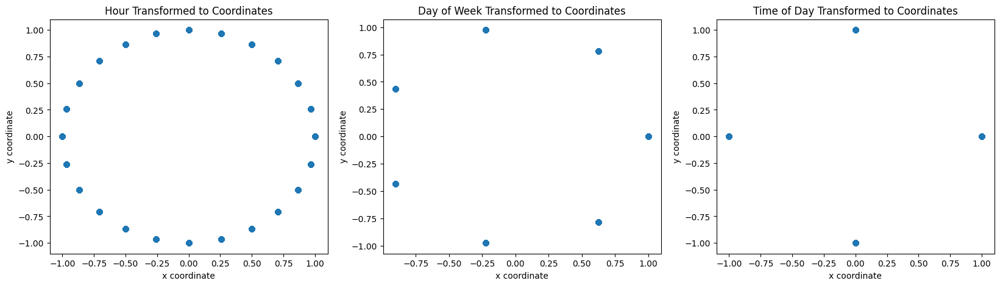

In [43]:
# Plot the coordinates for the transformed temporal variables
# Each dot represents a particular hour/day/time of day
fig, ax = plt.subplots(1, 3, figsize=(20,5))
ax[0].scatter(youtube_df['hour_x_coord'], youtube_df['hour_y_coord'])
ax[0].set_title("Hour Transformed to Coordinates")
ax[0].set_xlabel("x coordinate")
ax[0].set_ylabel("y coordinate")

ax[1].scatter(youtube_df['day_of_week_x_coord'], youtube_df['day_of_week_y_coord'])
ax[1].set_title("Day of Week Transformed to Coordinates")
ax[1].set_xlabel("x coordinate")
ax[1].set_ylabel("y coordinate")

ax[2].scatter(youtube_df['time_of_day_x_coord'], youtube_df['time_of_day_y_coord'])
ax[2].set_title("Time of Day Transformed to Coordinates")
ax[2].set_xlabel("x coordinate")
ax[2].set_ylabel("y coordinate")
plt.show()

The three plots above show the resulting x-y coordinate pairs for each of the three time features. As you can see, each hour, day, and time of day are now represented as a unique point on the circle, effectively capturing the distance between each value.

### Text Cleaning

To make use of the text features in the dataset, we first had to clean them. We wanted to keep as much information in the text as possible, including text that would normally be removed such as punctuation, because it could provide important semantic context for this use case. For example, a title that is in all caps or has many exclamation marks has different meaning than the same title with normal casing and no punctuation, and it is possible that titles with these attributes drive higher engagement. We left the titles as-is and removed urls, newline characters, carriage return characters, and excess whitespace from the descriptions. We also type cast the descriptions as strings to turn the missing values into string representations of a missing value, since whether or not a video has a description could be useful information.

In [44]:
# Check for missing text values
print(f"Missing video descriptions: {youtube_df['description'].isna().sum()}")
print(f"Missing video titles: {youtube_df['title'].isna().sum()}")

Missing video descriptions: 98
Missing video titles: 0


In [45]:
# Remove noise (urls, emails, newlines, carriage returns) from a text
def remove_noise(text):
  text = text.strip()
  text = re.sub(r'https?://\S+|www\.\S+', '', text)
  text = re.sub(r'\r', '', text)
  text = re.sub(r'\\n', ' ', text)
  text = re.sub(r'\s{2}', ' ', text)
  return text

# Converting the descriptions to strings will effectively replace any missing
# values with a string that represents a missing value
youtube_df['description'] = youtube_df['description'].astype(str)

# Clean the descriptions
youtube_df['description']= youtube_df['description'].apply(remove_noise)

In [46]:
# View the first 5 cleaned descriptions
pd.DataFrame(youtube_df['description']).head(5)

,description
0,Kentucky Gov. Matt Bevin confirmed there was a shooting at a high school in western Kentucky. Le...
1,Coach Taggart addresses the media ahead of the Duck's match up this weekend against the Arizona ...
2,"Artwork Forge II - an art installation created by artist Toby Atticus Fraley, is currently on di..."
3,Three deputies and one police officer were shot and wounded in northern South Carolina early Tue...
4,Anyone have one of those?


The cell above shows what the descriptions look like after being cleaned.

### Sentiment Analysis


In addition to using the textual features directly in the model, we also decided to use sentiment analysis to extract additional information from the text using an out-of-box sentiment analysis model called VADER (Valence Aware Dictionary and sEntiment Reasoner). We chose to use VADER because it was trained specifically on social media posts, which are similar in nature to the text in our dataset. It also has the added benefit of being able to determine not just the overall sentiment of a text (positive, negative, or neutral) but also the intensity of that sentiment. For each title and description, we used VADER to get the overall sentiment of the text as well as the sentiment broken down into negative, neutral, and positive components. The overall sentiment intensity score ranges from -1 to +1, where -1 is the most negative sentiment and +1 is the most positive sentiment. The sentiment component scores range from 0 to 1 and represent the ratios for proportions of text that fall into each category (positive, neutral, or negative). The overall sentiment score is generally the score used by researchers for sentiment analysis because it provides a weighted composite score that is a more interpretable measure of sentiment than the sentiment component scores.

In [47]:
# Initialize vader sentiment intensity analyzer
sentiment_analyzer = SentimentIntensityAnalyzer()

# For each text, analyze the sentiment and extract each component as a new variable
def analyze_sentiment(text):
  sentiment = sentiment_analyzer.polarity_scores(text)
  neg_score = sentiment['neg']
  neu_score = sentiment['neu']
  pos_score = sentiment['pos']
  overall_score = sentiment['compound']
  return pd.Series([neg_score, neu_score, pos_score, overall_score])

# Apply to both the titles and descriptions
youtube_df[['title_neg_sentiment', 'title_neu_sentiment', 'title_pos_sentiment', 'title_overall_sentiment']] = youtube_df['title'].apply(analyze_sentiment)
youtube_df[['description_neg_sentiment', 'description_neu_sentiment', 'description_pos_sentiment', 'description_overall_sentiment']] = youtube_df['description'].apply(analyze_sentiment)

In [48]:
# View the sentiment scores for the first 5 titles and descriptions
youtube_df[['title', 'description', 'title_neg_sentiment', 'title_neu_sentiment', 'title_pos_sentiment', 'title_overall_sentiment', 'description_neg_sentiment', 'description_neu_sentiment', 'description_pos_sentiment', 'description_overall_sentiment']].head()


,title,description,title_neg_sentiment,title_neu_sentiment,title_pos_sentiment,title_overall_sentiment,description_neg_sentiment,description_neu_sentiment,description_pos_sentiment,description_overall_sentiment
0,"1 dead, others injured after Ky. school shooting",Kentucky Gov. Matt Bevin confirmed there was a shooting at a high school in western Kentucky. Le...,0.538,0.462,0.0,-0.7906,0.000,0.920,0.080,0.4173
1,Coach Taggart Monday Presser Ahead of Arizona,Coach Taggart addresses the media ahead of the Duck's match up this weekend against the Arizona ...,0.000,1.000,0.0,0.0000,0.000,1.000,0.000,0.0000
2,Artwork Forge,"Artwork Forge II - an art installation created by artist Toby Atticus Fraley, is currently on di...",0.000,1.000,0.0,0.0000,0.000,0.970,0.030,0.2500
3,"Raw: 3 South Carolina Deputies, 1 Officer Shot",Three deputies and one police officer were shot and wounded in northern South Carolina early Tue...,0.000,1.000,0.0,0.0000,0.035,0.863,0.102,0.9099
4,Huffy Metaloid Bicycle Commercial 1997,Anyone have one of those?,0.000,1.000,0.0,0.0000,0.000,1.000,0.000,0.0000


In [49]:
# Display most negative and most positive sentiment for title and description
print("Most negative title(s)")
display(youtube_df[['title', 'title_overall_sentiment']][youtube_df['title_overall_sentiment'] == youtube_df['title_overall_sentiment'].min()])

print("\nMost negative description(s)")
display(youtube_df[['description', 'description_overall_sentiment']][youtube_df['description_overall_sentiment'] == youtube_df['description_overall_sentiment'].min()])

print("Most positive title(s)")
display(youtube_df[['title', 'title_overall_sentiment']][youtube_df['title_overall_sentiment'] == youtube_df['title_overall_sentiment'].max()])

print("\nMost positive description(s)")
display(youtube_df[['description', 'description_overall_sentiment']][youtube_df['description_overall_sentiment'] == youtube_df['description_overall_sentiment'].max()])

Most negative title(s)


,title,title_overall_sentiment
4182,THIS HAS TO STOP! INSTAGRAM TRENDS I HATED IN 2017 AND NEED TO DIE,-0.9299



Most negative description(s)


,description,description_overall_sentiment
5313,"In this video, Keaton, crying in the passenger seat, describes having milk poured on him and ham...",-0.9986


Most positive title(s)


,title,title_overall_sentiment
4280,"INDIAN STREET FOOD Tour DEEP in PUNJAB, INDIA | BEST STREET FOOD in INDIA and BEST CURRY HEAVEN!",0.945



Most positive description(s)


,description,description_overall_sentiment
4280,"AMAZING Indian Street Food TOUR in Punjab, India! It has some of the Best Street Food in INDIA, ...",0.9997
5020,"GOD LEVEL Street Food in MEXICO! We went for a full on Mexican street food tour in Puebla, Mexic...",0.9997


The cells above show examples of scores in the new features added to the dataset as well as examples of the titles and descriptions found to be the most negative and the most positive.

### BERT Embeddings


Text objects cannot be directly input to the model, so we used word embeddings to extract numeric features from the text that capture its semantic meaning. Given the complex, messy nature of the text in this dataset we decided to use BERT (Bidirectional Encoder Representations from Transformers), a pretrained large language model, to create the embeddings. BERT is built on Transformer architecture and is capable of extracting higher quality features than simpler models such as Word2Vec. To get the embeddings, we downloaded the model and its tokenizer from the HuggingFace transformers API and used the tokenizer to tokenize the text and then feed it to BERT. We tried generating the embeddings using just the titles, just the descriptions, and the titles and descriptions concatenated together, and found that the features extracted from the combined title and descriptions yielded the best results from the model.

We configured the BERT model to return all hidden states instead of just the last one, and then took the embeddings from the second to last layer. This decision was based on insights from Han Xiao, the creator of the open-source project bert-as-service, who came to the conclusion while working on the project that the embeddings in the second to last layer contain the most semantic context (McCormick, 2019). This is because the final layers are specific to the tasks that BERT was trained for, which are masked language modeling and next sentence prediction, while earlier layers are focused on the semantic context of the text. Since we used the second to last layer, we pooled the output from this layer to get an array with the shape (1, 768), corresponding to the 768 features extracted for a single text (the model was trained to generate fixed length vectors of length 768). To get around memory constraints, we processed the texts in batches of size 256. After getting the embeddings, we added them to a separate DataFrame to be added to the rest of the data after performing EDA.

In [50]:
# Load BERT and its tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-cased")
model = TFBertModel.from_pretrained("bert-base-cased", output_hidden_states=True)

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [51]:
# Test on one sample description
text = "Kentucky Gov. Matt Bevin confirmed there was a shooting at a high school in western Kentucky. Learn more about this story at more videos like this at Newsy on Facebook: Newsy on Twitter:"
tokenized_input = tokenizer(text, return_tensors='tf', padding=True)
output = model(**tokenized_input)

# Check the shape of the output
print(output.hidden_states[-2].shape)

# Check the shape after pooling the layer
print(tf.reduce_mean(output.hidden_states[-2], axis=1).shape)

(1, 44, 768)
(1, 768)


In [52]:
# For each text, generate a BERT embedding for it
def generate_embedding(text, is_title):
  # For titles, we use padding because we don't want to lose any information. For
  # descriptions, we use truncation because they are long and the most semantically
  # important information is likely towards the beginning of the sequence
  if is_title:
    tokenized_input = tokenizer(text, return_tensors='tf', padding=True)
  else:
    tokenized_input = tokenizer(text, return_tensors='tf', padding=True, truncation=True)

  # Run the tokenized input through the model to create the embedding
  output = model(**tokenized_input)

  # Select the embedding from the second to last hidden layer
  embedding = output.hidden_states[-2]

  # Pool the embedding to reduce the dimensions of the embedding to (1, 768)
  embedding_pooled = tf.reduce_mean(embedding, axis=1)
  return embedding_pooled.numpy()


In [53]:
# Create an iterable that batches texts
def batch_texts(texts, batch_size):
  for i in range(0, len(texts), batch_size):
    yield texts[i:min(i+batch_size, len(texts))]

In [54]:
# Get list of all the text documents to generate embeddings for
texts = list(youtube_df['title'].values + ' ' + youtube_df['description'].values)

# Create object to hold the embeddings
embedding_list = []

# Set the batch size for processing texts. Batching the input balances the speed
# of the operation and its memory usage
# Bigger batch size - faster, more memory intensive
# Smaller batch size - slower, less memory intensive
batch_size = 256

# Generate embeddings for each batch
i = 1
for batch in batch_texts(texts, batch_size):
  print(f"Processing batch {i}/{int(np.ceil(len(texts)/batch_size))}")
  text_embedding = generate_embedding(batch, is_title=False)
  embedding_list.append(text_embedding)
  i += 1

Processing batch 1/25
Processing batch 2/25
Processing batch 3/25
Processing batch 4/25
Processing batch 5/25
Processing batch 6/25
Processing batch 7/25
Processing batch 8/25
Processing batch 9/25
Processing batch 10/25
Processing batch 11/25
Processing batch 12/25
Processing batch 13/25
Processing batch 14/25
Processing batch 15/25
Processing batch 16/25
Processing batch 17/25
Processing batch 18/25
Processing batch 19/25
Processing batch 20/25
Processing batch 21/25
Processing batch 22/25
Processing batch 23/25
Processing batch 24/25
Processing batch 25/25


In [55]:
# Vertical stack the embeddings
stacked_embeddings = np.vstack(embedding_list)

# Check the shape of the embeddings
print(stacked_embeddings.shape)

# Create a separate dataframe to hold the embeddings
embeddings_df = pd.DataFrame(stacked_embeddings)

# Convert the column names to strings
embeddings_df.columns = embeddings_df.columns.map(str)

# View first 5 rows of embeddings
embeddings_df.head()

(6351, 768)


,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.006347,-0.015351,0.330442,0.033340,0.255476,0.043636,0.370765,-0.369620,-0.414625,0.175925,...,0.056548,-0.248437,0.090507,-0.492285,-0.112817,-0.031024,0.231957,0.181126,0.273348,0.754248
1,-0.357757,-0.253188,0.019458,0.002759,-0.303017,0.176927,0.480849,-0.187940,-0.360324,-0.010511,...,0.342374,0.124291,-0.277164,-0.634710,-0.051538,-0.454683,0.020594,0.311128,-0.063116,0.465240
2,-0.117271,0.285742,-0.020930,0.073008,0.206861,-0.044813,-0.041472,-0.319075,-0.265943,0.613474,...,-0.124810,-0.159527,-0.205265,-0.373897,0.025746,-0.419010,0.159699,-0.087445,0.057904,0.228844
3,0.086301,-0.242780,-0.216915,0.129556,0.600551,0.167611,0.163267,-0.363720,-0.043778,0.119069,...,0.003410,-0.073946,-0.180192,-0.462757,-0.079579,0.001352,-0.105581,-0.015510,-0.007445,0.374816
4,-0.188530,0.026314,0.147791,0.393741,-0.137212,0.155268,0.875035,-0.036451,-0.055119,-0.281483,...,0.443380,-0.093578,-0.480517,0.170592,-0.547314,0.040010,0.763060,0.521308,0.187470,0.609807


The cell above shows what the embeddings look like.

## Data understanding - EDA

After preparing the data, we peformed exploratory data analysis to better understand the data and any patterns that might be present. To start, we generated descriptive statistics for all the columns. This is a good way to get a quick overview of the distribution of each feature.

In [ ]:
# View descriptive statistics for all variables
youtube_df.describe(include='all')

,title,views,comments_disabled,ratings_disabled,description,category_label,hour,time_of_day,day_of_week,hour_x_coord,...,day_of_week_x_coord,day_of_week_y_coord,title_neg_sentiment,title_neu_sentiment,title_pos_sentiment,title_overall_sentiment,description_neg_sentiment,description_neu_sentiment,description_pos_sentiment,description_overall_sentiment
count,6351,6.351000e+03,6351,6351,6351,6351,6351.000000,6351.000000,6351.000000,6351.000000,...,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000
unique,6343,NaN,2,2,6178,16,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Mission: Impossible - Fallout (2018) - Official Trailer - Paramount Pictures,NaN,False,False,nan,Entertainment,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2,NaN,6246,6321,98,1621,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.963852e+06,NaN,NaN,NaN,NaN,13.517871,1.661313,2.629350,-0.048992,...,-0.041904,0.146719,0.063629,0.843993,0.092376,0.044272,0.034757,0.849335,0.112761,0.501778
std,NaN,7.061186e+06,NaN,NaN,NaN,NaN,6.493991,1.037751,1.844143,0.678155,...,0.730841,0.665389,0.131258,0.190113,0.156644,0.328718,0.054109,0.107245,0.086726,0.535606
min,NaN,5.590000e+02,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,-1.000000,...,-0.900969,-0.974928,0.000000,0.000000,0.000000,-0.929900,0.000000,0.000000,0.000000,-0.998600
25%,NaN,1.591565e+05,NaN,NaN,NaN,NaN,9.000000,1.000000,1.000000,-0.707107,...,-0.900969,-0.433884,0.000000,0.696500,0.000000,0.000000,0.000000,0.797500,0.054000,0.000000
50%,NaN,5.181070e+05,NaN,NaN,NaN,NaN,15.000000,2.000000,3.000000,-0.258819,...,-0.222521,0.433884,0.000000,1.000000,0.000000,0.000000,0.013000,0.860000,0.105000,0.738300
75%,NaN,1.474750e+06,NaN,NaN,NaN,NaN,18.000000,3.000000,4.000000,0.500000,...,0.623490,0.781831,0.000000,1.000000,0.184000,0.153100,0.049000,0.914000,0.157000,0.934950


Some notable statistics are the ones for the views column. The mean view count of the trending videos is approximately 1,963,852 views, but the median value is 518,107, indicating significant skewness. The lowest view count was 559 views, while the max view count was about 225,211,900. The standard is also quite large, at 7,061,186, indicating that data points are spread far from the mean.

### Univariate Analysis

In this section, we performed univariate analysis on each of the variables (with the exception of the embeddings because they aren't interpretable) to individually to examine their distributions and look for any patterns present.

#### Views Distribution

A histogram and boxplot were used to visualize the distribution of the view count as they are effective tools to visualize continuous data. We also used a density plot to smooth the values and make it easier to see the shape of the distribution. These plots help us better understand the number of views and see patterns in the data.


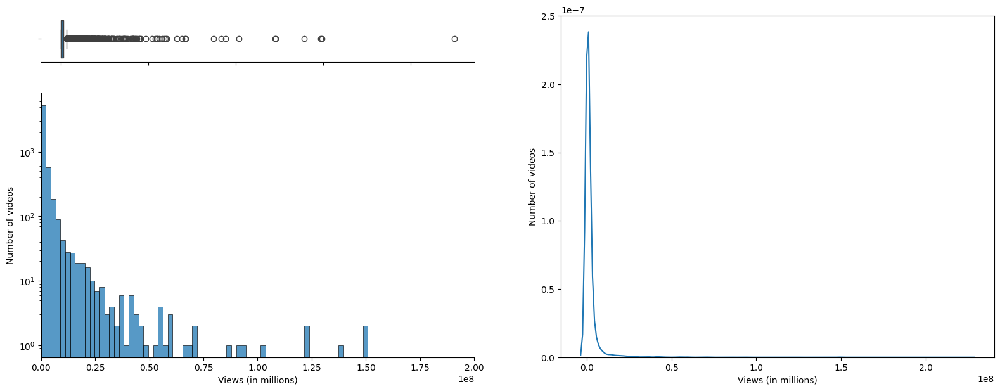

In [ ]:
# Plot the original distribution of the target feature (views)
fig = plt.figure(figsize=(30,7))
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1])

# Configure subplots (the first two are stacked)
gs_sub = gs[0, 1].subgridspec(2, 1, height_ratios=[0.15, 0.85])
ax_box = fig.add_subplot(gs_sub[0])
ax_hist = fig.add_subplot(gs_sub[1])
ax_kde = fig.add_subplot(gs[0,2])

# Create a stacked boxplot and histogram for views
sns.boxplot(x=youtube_df['views'], ax=ax_box)
sns.histplot(x=youtube_df['views'], bins=100, ax=ax_hist)

ax_box.tick_params(labelbottom=False)
ax_box.set(xlabel=None)

ax_hist.set(xlim=(0, 200000000))
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

ax_hist.set(xlabel='Views (in millions)')
ax_hist.set(ylabel='Number of videos')
ax_hist.set_yscale('log')

# Create a density plot for views
sns.kdeplot(data=youtube_df['views'], ax=ax_kde)
ax_kde.set(xlabel='Views (in millions)')
ax_kde.set(ylabel='Number of videos')

plt.show()

Looking at these plots confirm that the views are indeed significantly right-skewed with many outliers. The kernel density plot shows that the data only has one peak.

Given the significant skewness of the target variable, it is likely that we will need to normalize it for modeling, so it is also useful to visualize the distribution of the variable on the log scale, which changes the scale of the variable from absolute to relative (values represent changes between values).

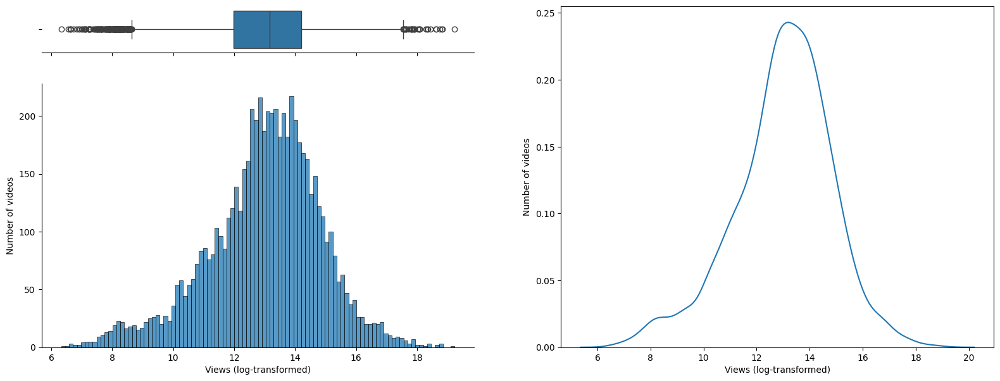

In [ ]:
# Plot the distribution of the log-transformed target
fig = plt.figure(figsize=(30,7))
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1])

# Configure subplots (the first two are stacked)
gs_sub = gs[0, 1].subgridspec(2, 1, height_ratios=[0.15, 0.85])
ax_box = fig.add_subplot(gs_sub[0])
ax_hist = fig.add_subplot(gs_sub[1])
ax_kde = fig.add_subplot(gs[0,2])

# Create a stacked boxplot and histogram for views
sns.boxplot(x=np.log(youtube_df['views']), ax=ax_box)
sns.histplot(x=np.log(youtube_df['views']), bins=100, ax=ax_hist)

ax_box.tick_params(labelbottom=False)
ax_box.set(xlabel=None)

sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

ax_hist.set(xlabel='Views (log-transformed)')
ax_hist.set(ylabel='Number of videos')

# Create a density plot for views
sns.kdeplot(data=np.log(youtube_df['views']), ax=ax_kde)
ax_kde.set(xlabel='Views (log-transformed)')
ax_kde.set(ylabel='Number of videos')

plt.show()

After the log transformation, the views still have quite a few outliers but the the distribution is approximately normal. This will be useful for modeling later.

#### Category Counts

By visualizing the count of the categories of the dataset, we can then see which categories of videos appear more frequently in the dataset.

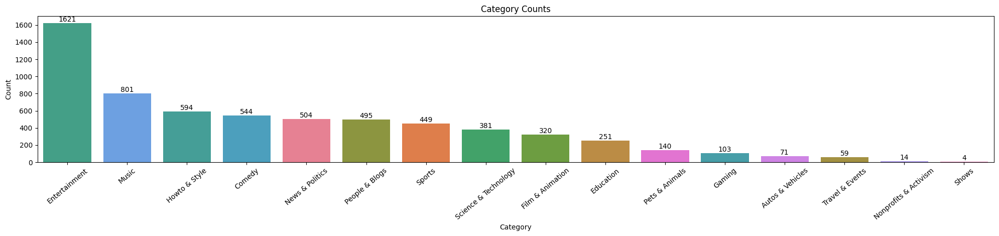

In [ ]:
# Plot the number of videos in each category
plt.figure().set_figwidth(20)
ax = sns.countplot(youtube_df, x='category_label', hue='category_label', order=youtube_df['category_label'].value_counts().index)
ax.tick_params(axis='x', labelrotation=40)
for container in ax.containers:
    ax.bar_label(container)
plt.title('Category Counts')
plt.ylabel('Count')
plt.xlabel('Category')
plt.tight_layout()
plt.show()

The most prevalent category was Entertainment with 1621 videos, followed by Music with 801 videos and Howto & Style with 594 videos. It is clear from this chart that this category is imbalanced, which could potentially intoduce bias into a model.

#### Comments & Ratings (Video Settings)

We used count plots to view the amount of videos with comments and ratings disabled.

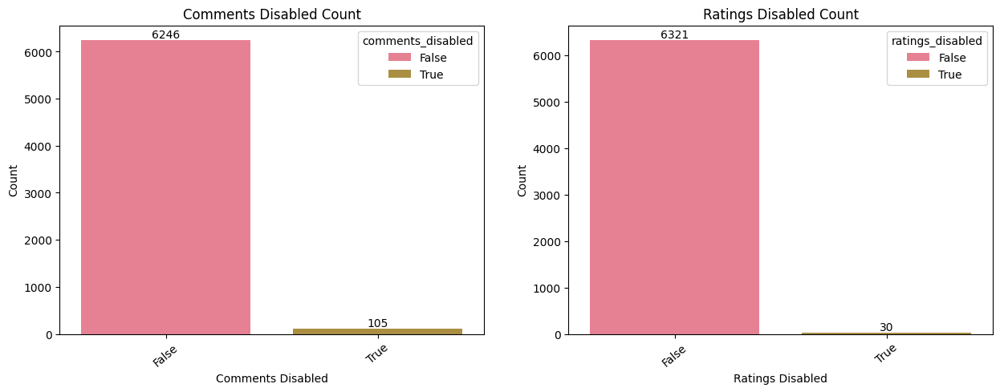

In [ ]:
# Plot the counts of videos with comments disabled (true/false)
fig, ax = plt.subplots(1, 2, figsize=(15,5))
sns.countplot(
    youtube_df,
    x='comments_disabled',
    hue='comments_disabled',
    palette=sns.color_palette("husl"),
    order=youtube_df['comments_disabled'].value_counts().index,
    ax=ax[0])
ax[0].tick_params(axis='x', labelrotation=40)
for container in ax[0].containers:
    ax[0].bar_label(container)
ax[0].set_title('Comments Disabled Count')
ax[0].set_ylabel('Count')
ax[0].set_xlabel('Comments Disabled')

# Plot the counts of videos with ratings disabled (true/false)
sns.countplot(
    youtube_df,
    x='ratings_disabled',
    hue='ratings_disabled',
    palette=sns.color_palette("husl"),
    order=youtube_df['ratings_disabled'].value_counts().index,
    ax=ax[1])
ax[1].tick_params(axis='x', labelrotation=40)
for container in ax[1].containers:
    ax[1].bar_label(container)
ax[1].set_title('Ratings Disabled Count')
ax[1].set_ylabel('Count')
ax[1].set_xlabel('Ratings Disabled')

plt.show()

Nearly all videos had their comments and ratings disabled, indicating that this feature may not be very useful for predicting views.

#### Upload Time

We used count plots to visualize the upload time variables (hour, day, time of day) in the dataset and see which were the most popular times to upload.

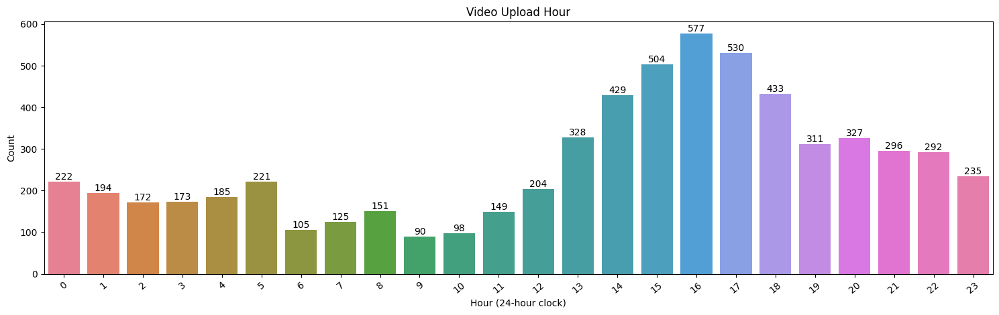

In [ ]:
# Plot the distribution of video upload hour
plt.figure().set_figwidth(15)
ax = sns.countplot(youtube_df, x='hour', palette=sns.color_palette("husl", 24))
ax.tick_params(axis='x', labelrotation=40)
for container in ax.containers:
    ax.bar_label(container)
plt.title('Video Upload Hour')
plt.ylabel('Count')
plt.xlabel('Hour (24-hour clock)')
plt.tight_layout()
plt.show()

The most popular upload time was 4 pm, and most videos were uploaded between 2 pm and 6 pm.

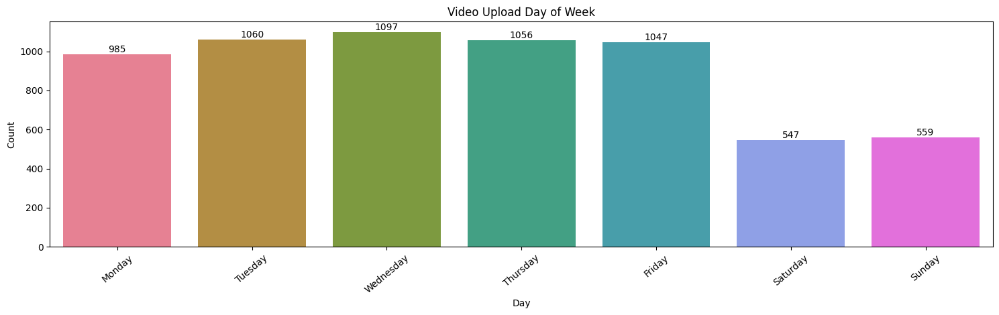

In [ ]:
# Plot the distribution of video upload day of week
plt.figure().set_figwidth(15)
ax = sns.countplot(youtube_df, x='day_of_week', palette=sns.color_palette("husl", 7))
ax.tick_params(axis='x', labelrotation=40)
ax.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
for container in ax.containers:
    ax.bar_label(container)
plt.title('Video Upload Day of Week')
plt.ylabel('Count')
plt.xlabel('Day')
plt.tight_layout()
plt.show()

Interestingly, the weekend was the least popular time to upload, with a similar number of videos being uploaded each weekday and the most uploads on Wednesday.

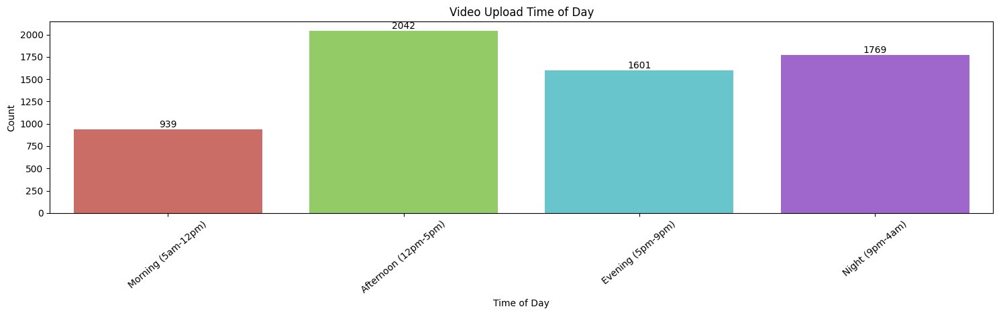

In [ ]:
# Plot the distribution of video upload time of day
plt.figure().set_figwidth(15)
ax = sns.countplot(youtube_df, x='time_of_day', palette=sns.color_palette("hls", 4))
ax.tick_params(axis='x', labelrotation=40)
ax.set_xticklabels(['Morning (5am-12pm)', 'Afternoon (12pm-5pm)', 'Evening (5pm-9pm)', 'Night (9pm-4am)'])
for container in ax.containers:
    ax.bar_label(container)
plt.title('Video Upload Time of Day')
plt.ylabel('Count')
plt.xlabel('Time of Day')
plt.tight_layout()
plt.show()

Most videos in the dataset were uploaded in the afteroon (12 pm to 5 pm), and the least popular time of day to upload was the morning (5 am to 12 pm).

#### Video Title Word Cloud

Much like using descriptive statistics to get an overview of the continuous data, we used word clouds to see the most frequently occuring words in the video titles. Prior to generating the word cloud, we preprocessed each title by removing punctuation, converting to lowercase, removing stop words, and removing one letter words. This operation was only applied to the text temporarily because it is required to generate a word cloud using the wordcloud library.

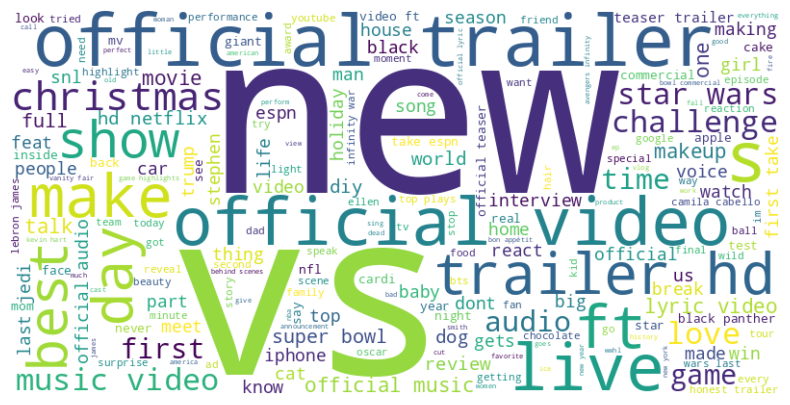

In [ ]:
# Create a word cloud of the most commonly appearing words in the title
# Temporarily preprocess the text to be compatible with WordCloud
def wordcloud_clean(text):
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    text = ' '.join(word for word in text.split() if word not in stop_words)
    # Remove one-letter words
    text = ' '.join(word for word in text.split() if len(word) > 1)
    return text

# Clean the titles
cleaned_titles = youtube_df['title'].apply(wordcloud_clean)

# Combine all the text into one string
titles_combined = ' '.join(cleaned_titles)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(titles_combined)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

The largest words in the world cloud are "new" and "vs," and the terms "official trailer" and "official video" appear prominently. This is unsurprising given that most videos in the dataset are Entertaiment videos, which would include movie trailers (note the Film & Animation seems to correspond to videos that are films or animation, and mainly does not include movie trailers). Many of the other words and terms that appear seem related to Music or Entertainment such as "live" and "music video."


#### Video Description Word Cloud

We repeated the same process to generate a word cloud for the video descriptions.

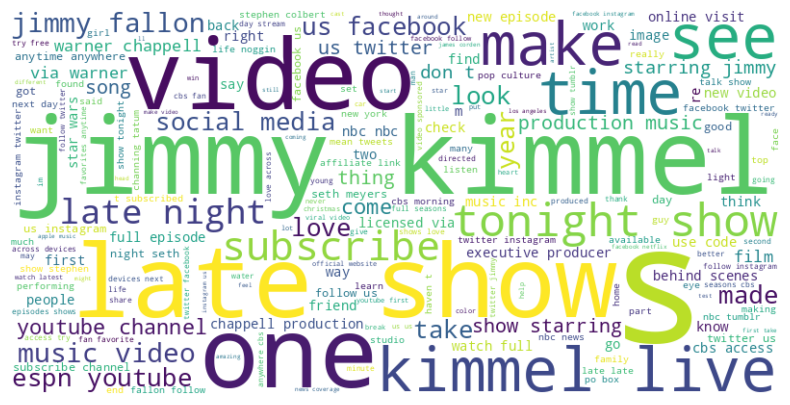

In [ ]:
# Clean the descriptions for the word cloud
cleaned_descriptions = youtube_df['description'].apply(wordcloud_clean)

# Combine all the text into one string
descriptions_combined = ' '.join(cleaned_descriptions)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(descriptions_combined)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

According to the word cloud for the video titles, the most prevalent words are "jimmy kimmel", "late show", "video", and “one,” signifying that many of the trending videos were talk shows. It is surprising to see that so many of the top terms relate to specific talk shows, which would be posted by a single creator. This could indicate that certain creators, such as Jimmy Kimmel Live and The Tonight Show starring Jimmy Fallon are overrepresented in the dataset.

#### Video Title Sentiment

To analyze the distribution of video title sentiment, we first generated descriptive statistics for each sentiment variable.

In [ ]:
# View descriptive statistics for the sentiment components
youtube_df[['title_neg_sentiment', 'title_neu_sentiment', 'title_pos_sentiment', 'title_overall_sentiment']].describe()

,title_neg_sentiment,title_neu_sentiment,title_pos_sentiment,title_overall_sentiment
count,6351.000000,6351.000000,6351.000000,6351.000000
mean,0.063629,0.843993,0.092376,0.044272
std,0.131258,0.190113,0.156644,0.328718
min,0.000000,0.000000,0.000000,-0.929900
25%,0.000000,0.696500,0.000000,0.000000
50%,0.000000,1.000000,0.000000,0.000000
75%,0.000000,1.000000,0.184000,0.153100
max,0.796000,1.000000,1.000000,0.945000


The overall sentiment title ranges from -0.930 to 0.945 with a mean of 0.044 and median , indicating that most titles have neutral sentiment (-1 corresponds to the most extreme negative sentiment, +1 corresponds to the most extreme positive sentiment, and values between -0.05 and 0.005 correspond to neutral sentiment). This is reinforced by the distribution of the other sentiment variables, for which neutral title sentiment has the highest median value at 1, which indicates a title has 100% neutral sentiment.

We used boxplots and a histogram to visualize the distribution of overall sentiment for video titles.

Text(0.5, 0, 'Sentiment Intensity')

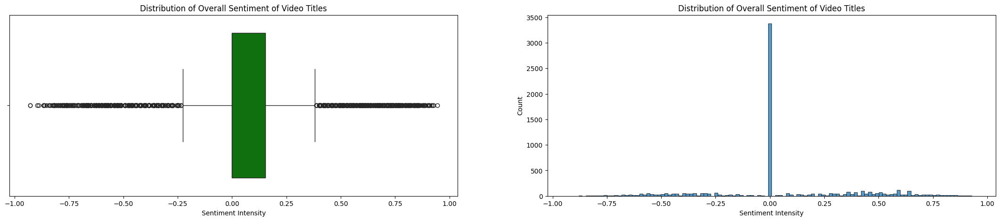

In [ ]:
# Plot the distribution of overall title sentiment scores
fig, ax = plt.subplots(1, 2, figsize=(27,5))
sns.boxplot(x=youtube_df['title_overall_sentiment'], native_scale=True, color="green", ax=ax[0])
ax[0].set_title('Distribution of Overall Sentiment of Video Titles')
ax[0].set_xlabel('Sentiment Intensity')

sns.histplot(x=youtube_df['title_overall_sentiment'], ax=ax[1])
ax[1].set_title('Distribution of Overall Sentiment of Video Titles')
ax[1].set_xlabel('Sentiment Intensity')

These plots show that the shape of the overall title sentiment distribution is symmetric and confirm that the majority of the video titles are neutral or slightly positive (>= 0.05), with most strong sentiment scores (either positive or negative) appearing as outliers. This is a surprising find given that YouTube videos are somewhat notorious for having sensationalized titles to drive engagement.

In addition to the plots of overall sentiment, we also plotted the video title sentiment components. We used stacked barplots and overlapping histograms to visualize the components together to make comparing them easier.

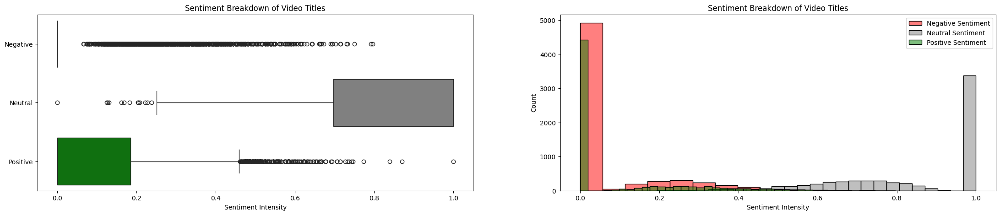

In [ ]:
# Plot distribution of each sentiment component
fig, ax = plt.subplots(1, 2, figsize=(27,5))
sns.boxplot(youtube_df[['title_neg_sentiment', 'title_neu_sentiment', 'title_pos_sentiment']], legend=False, orient="h", palette=['red','gray','green'], ax=ax[0])
ax[0].set_title('Sentiment Breakdown of Video Titles')
ax[0].set_xlabel('Sentiment Intensity')
ax[0].set_yticklabels(['Negative','Neutral','Positive'])

sns.histplot(youtube_df['title_neg_sentiment'], color='red', label='Negative Sentiment', alpha=0.5, ax=ax[1])
sns.histplot(youtube_df['title_neu_sentiment'], color='gray', label='Neutral Sentiment', alpha=0.5, ax=ax[1])
sns.histplot(youtube_df['title_pos_sentiment'], color='green', label='Positive Sentiment', alpha=0.5, ax=ax[1])
ax[1].set_title('Sentiment Breakdown of Video Titles')
ax[1].set_xlabel('Sentiment Intensity')
ax[1].legend()
plt.show()

These plots provide a more detailed picture of the distribution of the strength of different kinds of sentiment in the video titles. Again, these plots show that neutral title sentiment is significantly left-skewed, indicating that most titles are neutral. Both positive title sentiment and negative title sentiment are right-skewed, with negative title sentiment having more extreme skewness. In fact, it appears that almost all titles have little to no negative sentiment and titles with negative sentiment are outliers in this dataset.

#### Video Description Sentiment

We repeated the same process above for the video description sentiment variables.

In [ ]:
# View descriptive statistics for the sentiment components
youtube_df[['description_neg_sentiment', 'description_neu_sentiment', 'description_pos_sentiment', 'description_overall_sentiment']].describe()

,description_neg_sentiment,description_neu_sentiment,description_pos_sentiment,description_overall_sentiment
count,6351.000000,6351.000000,6351.000000,6351.000000
mean,0.034757,0.849335,0.112761,0.501778
std,0.054109,0.107245,0.086726,0.535606
min,0.000000,0.000000,0.000000,-0.998600
25%,0.000000,0.797500,0.054000,0.000000
50%,0.013000,0.860000,0.105000,0.738300
75%,0.049000,0.914000,0.157000,0.934950
max,0.632000,1.000000,0.800000,0.999700


The overall description sentiment ranges from -0.999 to 0.999 with a mean value of 0.50 and median of 0.738. This is much different than the distribution of the overall title sentiment, and indicates that the majority of descriptions have positive sentiment.

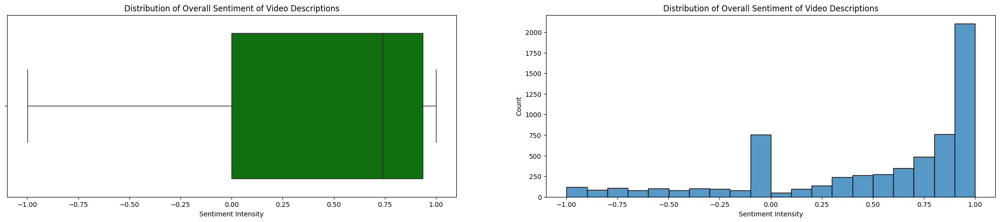

In [ ]:
# Plot the distribution of overall description sentiment scores
fig, ax = plt.subplots(1, 2, figsize=(27,5))
sns.boxplot(x=youtube_df['description_overall_sentiment'], native_scale=True, color="green", ax=ax[0])
ax[0].set_title('Distribution of Overall Sentiment of Video Descriptions')
ax[0].set_xlabel('Sentiment Intensity')

sns.histplot(x=youtube_df['description_overall_sentiment'], ax=ax[1])
ax[1].set_title('Distribution of Overall Sentiment of Video Descriptions')
ax[1].set_xlabel('Sentiment Intensity')
plt.show()

The boxplot and histogram for the overall video description sentiment are left-skewed, again indicating that most of the descriptions are classified as having positive sentiment.

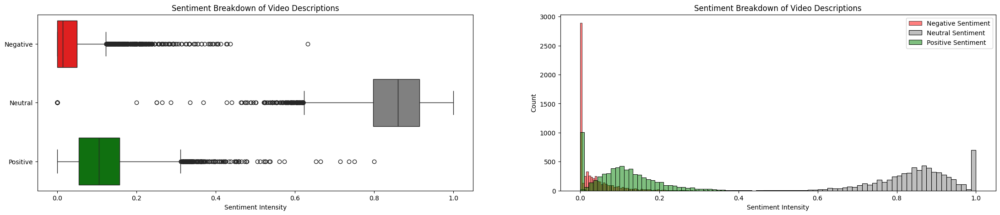

In [ ]:
# Plot distribution of each sentiment component
fig, ax = plt.subplots(1, 2, figsize=(27,5))
sns.boxplot(youtube_df[['description_neg_sentiment', 'description_neu_sentiment', 'description_pos_sentiment']], legend=False, orient="h", palette=['red','gray','green'], ax=ax[0])
ax[0].set_title('Sentiment Breakdown of Video Descriptions')
ax[0].set_xlabel('Sentiment Intensity')
ax[0].set_yticklabels(['Negative','Neutral','Positive'])

sns.histplot(youtube_df['description_neg_sentiment'], color='red', label='Negative Sentiment', alpha=0.5, ax=ax[1])
sns.histplot(youtube_df['description_neu_sentiment'], color='gray', label='Neutral Sentiment', alpha=0.5, ax=ax[1])
sns.histplot(youtube_df['description_pos_sentiment'], color='green', label='Positive Sentiment', alpha=0.5, ax=ax[1])
ax[1].set_title('Sentiment Breakdown of Video Descriptions')
ax[1].set_xlabel('Sentiment Intensity')
ax[1].legend()
plt.show()

Similar to the title sentiment components, the negative and positive sentiment components are left-skewed and the neutral sentiment component is right-skewed. While at first this may seem contradictory to the distribution of overall sentiment, the discrepancy is because the overall sentiment score is a normalized composite score while the sentiment component scores are raw categorizations of how much of a particular text belong to a sentiment category. This means that, for example, a text could have a high (positive) sentiment intensity but a lower positive sentiment component score if the ratio of positive elements in that text are low. Based on this analysis, it seems like the overall sentiment scores are more useful for prediction than the component scores.

### Multivariate Analysis

After completing the univariate analysis, we performed multivariate analysis of the variables to look for relationships between them.

#### Correlation Matrix

We used a correlation matrix to look for linear relationships between all the relevant variables, where a darkly colored cell (either red for positive or blue for negative) represents a strong linear relationship between those two variables. The correlation scores between views and the other variables appear in the first row of the matrix.

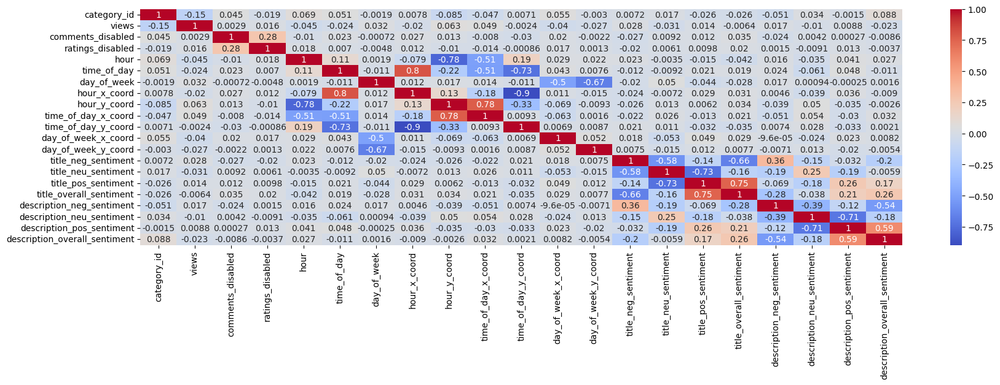

In [56]:
# Generate a correlation matrix for all the continuous variables
corr = youtube_df[[col for col in youtube_df.columns if col not in ['description', 'title', 'category_label']]].corr()
fig, ax = plt.subplots(figsize=(20, 5))
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=ax)
plt.show()

In [57]:
# Drop the category ids since we no longer need them
youtube_df.drop(['category_id'], axis=1, inplace=True)

No strong linear relationships appear between views and the other variables, although there is a weak, negative relationship between views and the video category. This led us to suspect there could be complex, non-linear relationships present in the data. These relationships can be more accurately modeled using a non-linear model, such as a tree-based model.

### Examining Relationships between Views and Predictor Variables

We performed bivariate analysis to visualize the relationships between views and each of the other variables, specifically inspecting for non-linear relationships and starting with plotting overall sentiment scores for both the titles and descriptions against views. Due to the views spanning several orders of magnitude, we plotted the views on a log 10 scale to be able to effictively see any patterns in the plot.

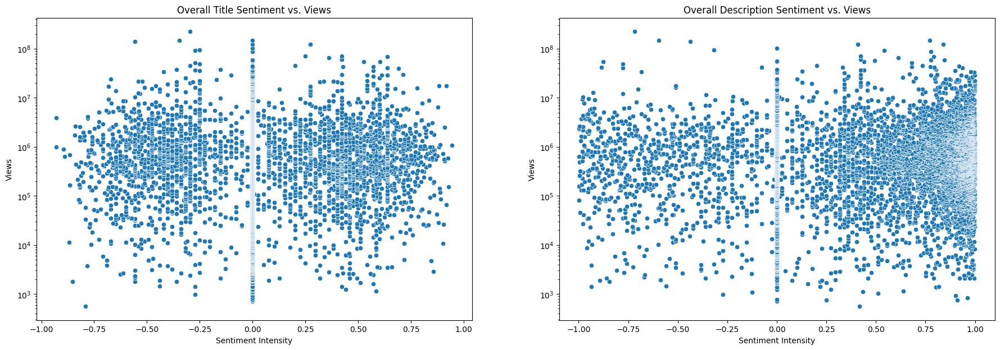

In [ ]:
# Plot views against title and description overall sentiment
fig, ax = plt.subplots(1, 2, figsize=(22,7))
sns.scatterplot(data=youtube_df, x='title_overall_sentiment', y='views', ax=ax[0])
ax[0].set_yscale('log')
ax[0].set_xlabel('Sentiment Intensity')
ax[0].set_ylabel('Views')
ax[0].set_title('Overall Title Sentiment vs. Views')

sns.scatterplot(data=youtube_df, x='description_overall_sentiment', y='views', ax=ax[1])
ax[1].set_yscale('log')
ax[1].set_xlabel('Sentiment Intensity')
ax[1].set_ylabel('Views')
ax[1].set_title('Overall Description Sentiment vs. Views')
plt.show()

In the plot of overall title sentiment against views, we can see that the the data points are distributed symetrically around 0. There is no apparent pattern in this plot, which suggests that there may not be a relationship between overall title sentiment and the number of views a video gets. In the plot of overall description sentiment against views, on the other hand, the data points on the right side of the plot become more densely packed as they approach 1.  This makes sense as we know that the mean and median are approximately 0.501 and 0.738 respectively, however, the view counts are spread evenly across the range of sentiment intensity values so it is not clear if there is a relationship between description sentiment and video view count.

Next, we created scatterplots plotting the individual sentiment components for title and description against views.

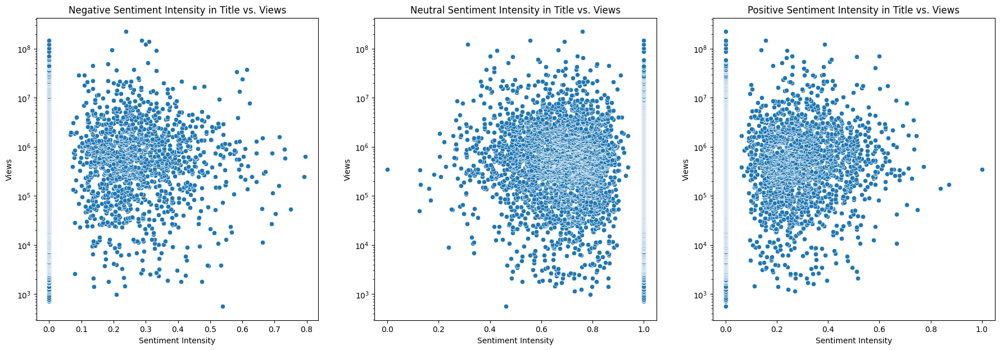

In [ ]:
# Plot views against title sentiment
fig, ax = plt.subplots(1, 3, figsize=(22,7))
sns.scatterplot(data=youtube_df, x='title_neg_sentiment', y='views', ax=ax[0])
ax[0].set_yscale('log')
ax[0].set_xlabel('Sentiment Intensity')
ax[0].set_ylabel('Views')
ax[0].set_title('Negative Sentiment Intensity in Title vs. Views')

sns.scatterplot(data=youtube_df, x='title_neu_sentiment', y='views', ax=ax[1])
ax[1].set_yscale('log')
ax[1].set_xlabel('Sentiment Intensity')
ax[1].set_ylabel('Views')
ax[1].set_title('Neutral Sentiment Intensity in Title vs. Views')

sns.scatterplot(data=youtube_df, x='title_pos_sentiment', y='views', ax=ax[2])
ax[2].set_yscale('log')
ax[2].set_xlabel('Sentiment Intensity')
ax[2].set_ylabel('Views')
ax[2].set_title('Positive Sentiment Intensity in Title vs. Views')
plt.show()

All three scatterplots share similar characteristics in that they each have a vertical bar of tightly stacked points appearing at either 0 for negative and positive sentiment intensity, or at 1 for neutral sentiment. They also each have a horizontaly-oriented cluster of points around the mean for each sentiment component. This distribution of points mirrors the overlapping histograms we created earlier. The majority of points are distributed symmetrically along the range of views for each plot, with most points clustered around the middle of the range (the views are log-transformed here so the y-scale represents orders of magnitude, and not absolute view counts), however, since on the views are approximately normal on a log scale this is not clear evidence of a pattern.

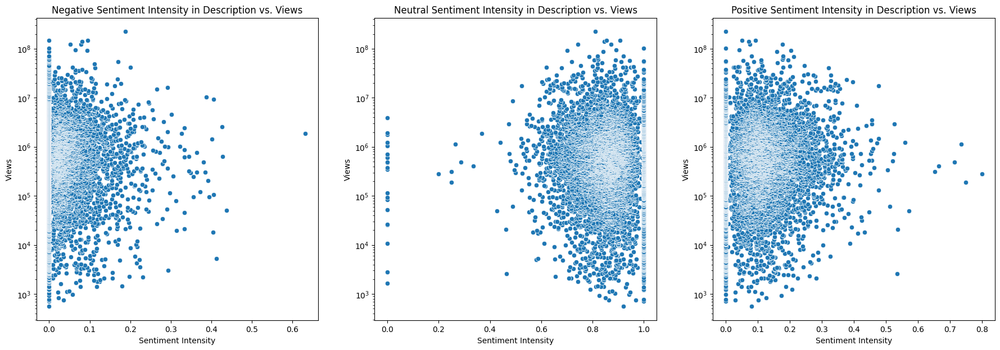

In [ ]:
# Plot views against description sentiment
fig, ax = plt.subplots(1, 3, figsize=(22,7))
sns.scatterplot(data=youtube_df, x='description_neg_sentiment', y='views', ax=ax[0])
ax[0].set_yscale('log')
ax[0].set_xlabel('Sentiment Intensity')
ax[0].set_ylabel('Views')
ax[0].set_title('Negative Sentiment Intensity in Description vs. Views')

sns.scatterplot(data=youtube_df, x='description_neu_sentiment', y='views', ax=ax[1])
ax[1].set_yscale('log')
ax[1].set_xlabel('Sentiment Intensity')
ax[1].set_ylabel('Views')
ax[1].set_title('Neutral Sentiment Intensity in Description vs. Views')

sns.scatterplot(data=youtube_df, x='description_pos_sentiment', y='views', ax=ax[2])
ax[2].set_yscale('log')
ax[2].set_xlabel('Sentiment Intensity')
ax[2].set_ylabel('Views')
ax[2].set_title('Positive Sentiment Intensity in Description vs. Views')
plt.show()

The scatterplots for the individual sentiment components for descriptions against views are very similar to the ones for the title sentiment components, with the difference being that the points are more tightly clustered around either the low end on the sentiment intensity range for negative and positivie sentiment, and the high end of the range for neutral sentiment. There is also no clear evidence of a pattern here, as the points are distributed roughly symmetrically around the y-axis.


After performing bivariate analysis with the sentiment variables, we used barplots to analyze the relationship between upload time and views.

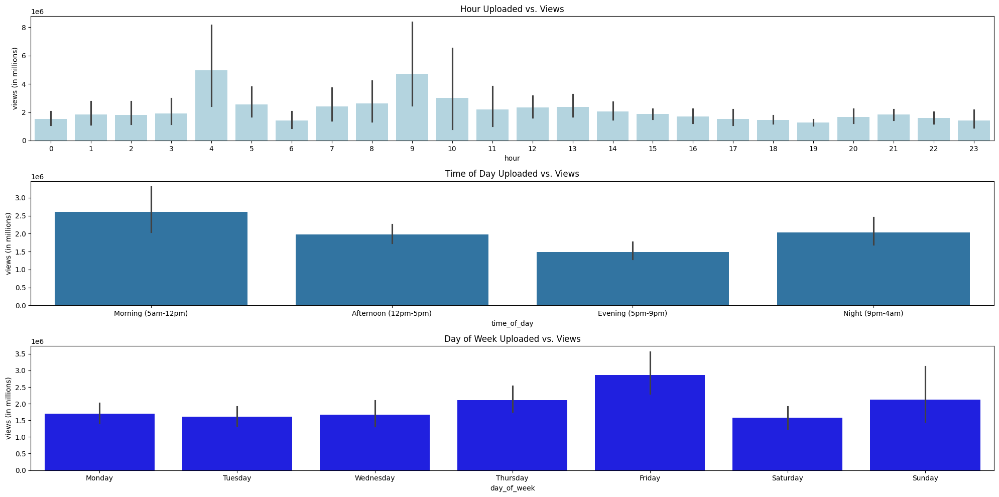

In [10]:
# Plot the view counts against upload time
fig, (ax_hour, ax_time, ax_day) = plt.subplots(3, figsize=(20,10))

sns.barplot(data=youtube_df, x='hour', y='views', ax=ax_hour, color='lightblue')
sns.barplot(data=youtube_df, x='time_of_day', y='views', ax=ax_time)
sns.barplot(data=youtube_df, x='day_of_week', y='views', ax=ax_day, color='blue')

ax_hour.set_title('Hour Uploaded vs. Views')
ax_time.set_title('Time of Day Uploaded vs. Views')
ax_day.set_title('Day of Week Uploaded vs. Views')

ax_hour.set_ylabel('views (in millions)')
ax_time.set_ylabel('views (in millions)')
ax_day.set_ylabel('views (in millions)')

ax_time.set_xticklabels(['Morning (5am-12pm)', 'Afternoon (12pm-5pm)', 'Evening (5pm-9pm)', 'Night (9pm-4am)'])
ax_day.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.tight_layout()
plt.show()

In the hour uploaded vs. views plot, the view counts for most upload hours are mostly level, but videos uploaded at 4 am or 9 am have substantianlly more views. Videos uploaded at 10 am seem to also have slightly higher view counts than most of the other hours. This inidcates that there may be some relationship between upload hour and view count.

In the time of day uploaded vs. views plot, videos uploaded in the morning typically had a higher view count, while videos uploaded in the evening typically had a lower view count. In the day of the week uploaded vs. views plot, videos uploaded on Thursdays, Sundays, and especially Fridays tended to have higher view counts. This suggests that overall, upload time may influence how many views a video will get.

Next, we used a strip plot to visualize the comments and ratings disabled against views.

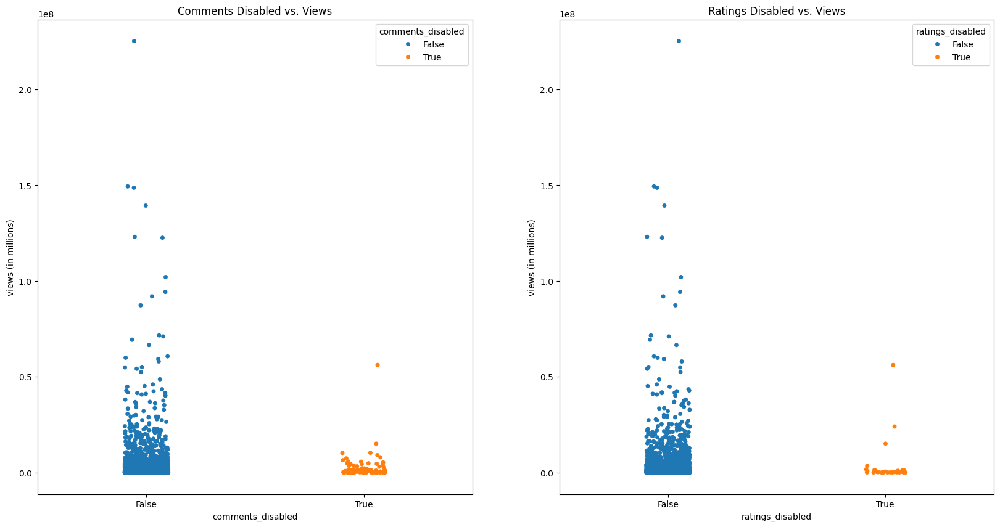

In [ ]:
# Plot views against comments disabled and ratings disabled
fig, ax = plt.subplots(1, 2, figsize=(20,10))

sns.stripplot(data=youtube_df, x="comments_disabled", y="views", hue='comments_disabled', ax=ax[0])
ax[0].set_title('Comments Disabled vs. Views')
ax[0].set_ylabel('views (in millions)')

sns.stripplot(data=youtube_df, x="ratings_disabled", y="views", hue='ratings_disabled', ax=ax[1])
ax[1].set_title('Ratings Disabled vs. Views')
ax[1].set_ylabel('views (in millions)')
plt.show()

The distribution of views is roughly the same for comments disabled and ratings disabled, although as mentioned earlier, almost all videos have both their comments and ratings enabled, so this variable is not very useful for analysis or prediction and there is no pattern here.

Finally, we used a box plot to visualize the relationship between the categories and views to better understand how each category may impact the view count of a video.

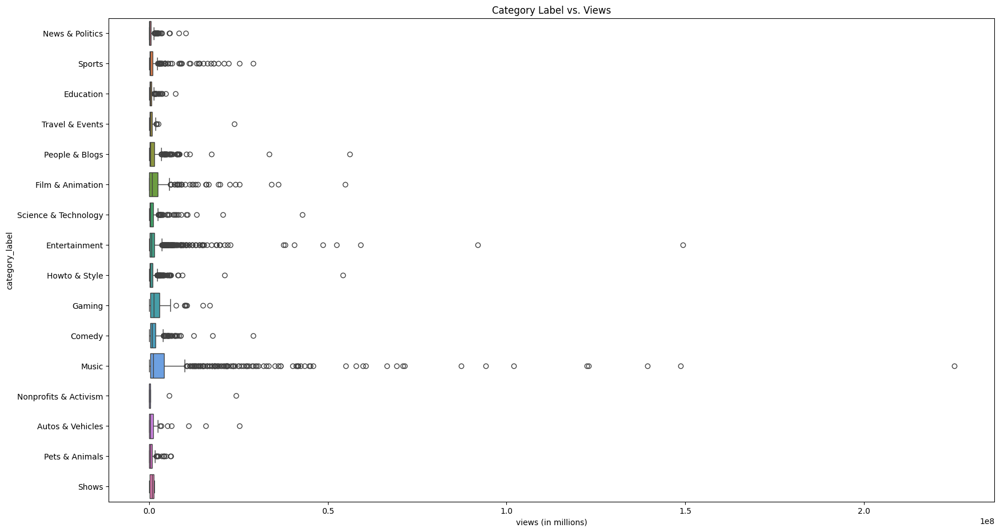

In [11]:
# Plot views for each category
fig, ax = plt.subplots(1, 1, figsize=(20, 11))
sns.boxplot(data=youtube_df, x="views", y="category_label", ax=ax, hue='category_label')
plt.title('Category Label vs. Views')
plt.xlabel('views (in millions)')
plt.show()


 We can see from the box plots that the views distribution for each category is different. Music and Entertaiment are the categories with the most views and Shows, Nonprofits & Activism, and Travel & Events are the categories with some of the least, however, we know from our earlier univariate analysis that Entertainment is overrepresented and Shows, Nonprofits & Activism, and Travel & Events are all underrepresented, which could influence this observed effect. Still, it is likely that the category of a video has an effect on its view count.

## Feature Selection

Since our data analysis did not reveal any strong evidence of linear relationships between the predictor variables and views, feature selection was largely driven by the feature importances from the tree models we used, particularly the random forest regressor models. We started by incorporating all available features into the models and then progressively removing features that seemed to contribute very little based on feature importances and re-evaluating the performance of the models. In all iterations, the category labels and many of the text embedding features dominated the feature importances. The category labels in particular were almost always chosen as the most important feature, indicating that this feature has the most predictive power. Most of the temporal variables did not have high feature importances, but the hour x and y coordinate variables improved the performance of the models slightly. Similarly, most of the sentiment features did not contribute much, but the overall title sentiment and overall description sentiment provided a small performance improvement.

In [ ]:
# Create a copy of the data and add the embeddings
model_data = youtube_df.copy()
model_data = pd.concat([model_data, embeddings_df], axis=1)

# Shuffle the data since we sorted it earlier
model_data = shuffle(model_data, random_state=19)
model_data.head()

,title,views,comments_disabled,ratings_disabled,description,category_label,hour,time_of_day,day_of_week,hour_x_coord,...,758,759,760,761,762,763,764,765,766,767
1168,I Trained Like Rey From Star Wars For A Month ⚔️,94032,False,False,"For the Season 1 finale of #MKultra, I trained like Rey from Star Wars for a month! What did ya ...",Entertainment,16,1,4,-5.000000e-01,...,-0.020942,-0.132228,-0.329492,-0.681988,-0.143469,-0.615716,-0.227174,0.257109,0.268048,0.164570
298,"Mesmerizing Shockwaves in Your Window Screen (18,000FPS) - Beyond Slow Motion",12468,False,False,I was hanging out with Kevin Kohler (The Backyard Scientist) a while back and he brought up this...,Travel & Events,18,2,4,-1.836970e-16,...,0.243460,-0.153122,0.039554,-0.488440,-0.097321,-0.559992,0.507609,0.279976,0.432785,0.530896
2509,I made this sculpture using aluminium foil (and dancing),335613,False,False,Hey Dukeys! I hope you like this one :) I was thinking about what material I could use to make ...,Howto & Style,21,3,1,7.071068e-01,...,-0.200204,0.194034,-0.037180,-0.417634,-0.050512,-0.244495,0.337166,0.073820,0.274141,0.483531
2087,What would a government shutdown mean?,252623,False,False,"If Congress doesn't reach agreement on crucial immigration issues and pass a spending bill, the ...",News & Politics,14,1,4,-8.660254e-01,...,-0.103663,0.415799,-0.210726,-0.375596,-0.198483,-0.050252,0.078858,0.169201,0.036851,0.439444
1820,The Girl Next Door (Valentine's Day),199662,False,False,Prince Michael and Phil duke it out for the affection of the new girl on Valentine's Day. Click ...,Pets & Animals,14,1,1,-8.660254e-01,...,0.313758,0.242177,0.106378,-0.384986,0.035615,-0.544525,0.666824,0.168510,0.289481,0.821398


In [ ]:
# Print names of all viable features (excluding embeddings)
print([col for col in youtube_df.columns if col not in ['hour', 'time_of_day', 'day_of_week', 'description', 'title', 'category_label']])

['views', 'comments_disabled', 'ratings_disabled', 'hour_x_coord', 'hour_y_coord', 'time_of_day_x_coord', 'time_of_day_y_coord', 'day_of_week_x_coord', 'day_of_week_y_coord', 'title_neg_sentiment', 'title_neu_sentiment', 'title_pos_sentiment', 'title_overall_sentiment', 'description_neg_sentiment', 'description_neu_sentiment', 'description_pos_sentiment', 'description_overall_sentiment']


In [ ]:
# Select the features that will be used in the model
# NOTE: Must include category label
input_features = [
    'category_label',
    'hour_x_coord',
    'hour_y_coord',
    'title_overall_sentiment',
    'description_overall_sentiment'
]

# Add embedding feature names to the input features, if using
input_features.extend(list(embeddings_df.columns))

In [ ]:
# Separate the input and target
X = model_data[input_features]
y = model_data['views']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=19)

# Reset the index so that it's in order (needed for PCA to work)
X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

## Feature Engineering and Data Preprocessing: Part II (post-splitting)

This section includes the preprocessing and feature engineering operations that needed to be completed after splitting the data to avoid data leakage.

### Target Encoding Category

For the purposes of data analysis we left the category labels as strings, but in order to input them to the model they needed to be encoded. Since there is no ordering between categories, we needed an alternative to ordinal encoding. Given the large number of classes, one hot encoding was also not an ideal option due to the large number of dimensions that would be added to the dataset. Instead, we used target encoding for the category labels. Target encoding replaces each category with a measure of its effect on the target variable, in this case an estimate of the average target values for a particular category.

In [ ]:
# Target encode the category label
encoder = TargetEncoder(target_type='continuous')

# Do this after splitting the data into test and training sets to avoid data leakage
X_train['category_labels_encoded'] = encoder.fit_transform(pd.DataFrame(X_train['category_label']), y_train)
X_train.drop(columns=['category_label'], inplace=True)

X_test['category_labels_encoded'] = encoder.transform(pd.DataFrame(X_test['category_label']))
X_test.drop(columns=['category_label'], inplace=True)
X_test.head()

,hour_x_coord,hour_y_coord,title_overall_sentiment,description_overall_sentiment,0,1,2,3,4,5,...,759,760,761,762,763,764,765,766,767,category_labels_encoded
0,0.965926,2.588190e-01,0.0000,0.0000,-0.325928,-0.028238,0.173846,-0.427289,0.465888,-0.066583,...,0.320854,-0.342847,-0.340130,-0.048450,-0.502650,0.438307,0.192011,0.228330,0.776458,4.936772e+05
1,-1.000000,1.224647e-16,0.0000,0.4003,0.003934,-0.157310,0.172244,0.386501,0.422153,-0.147633,...,0.035577,0.057132,-0.310125,0.283405,-0.763538,0.428811,0.318217,0.570393,0.355921,1.351362e+06
2,-0.500000,-8.660254e-01,0.0772,0.2263,-0.722396,0.294733,-0.512281,0.462342,0.738437,-0.184819,...,-0.211827,-0.035494,0.122315,0.097486,0.142959,-0.123774,0.476057,0.497999,0.297910,1.848812e+06
3,-0.866025,-5.000000e-01,0.0000,0.9134,-0.051473,0.356871,0.146507,-0.068035,0.307737,0.142070,...,-0.112453,-0.227891,-0.306210,0.034317,-0.386970,0.494330,0.264411,0.182442,0.494218,1.224749e+06
4,-0.965926,-2.588190e-01,0.0000,0.9381,-0.152183,0.009002,-0.041757,0.142979,-0.045264,-0.054389,...,-0.024175,0.058573,-0.097194,-0.147743,-0.311433,0.369257,0.184689,0.489618,0.684375,1.351362e+06


### PCA

Using text embeddings caused the number of the dimensions in the dataset to explode from 16 to 784 and drastically increased the training time for the models, an example of the curse of dimensionality. To try and reduce the dimensionality of the data while still preserving as much information as possible, we attempted to use PCA (Principal Component Analysis) to replace the embeddings with the principal components that capture the maximum variance of the original data. We tried several different values for the number of components to be found by the PCA model, ranging from 3 to 384. Unfortunately, replacing the embeddings with any number of principal components hurt the performance of the models significantly, which could indicate that the features extracted from the embeddings contain unique information that can't easily be projected into lower dimensions without information loss. Furthermore, PCA is a linear dimensionality reduction technique, so it may not handle features with non-linear relationships well. We decided to not use this approach in the final models.

In [ ]:
# Use PCA to reduce the dimensions added from the BERT embeddings
# Get the columns corresponding to the embeddings
embedding_columns = list(embeddings_df.columns)

# Scale the data (PCA requires variables to be the same scale)
scaler = StandardScaler()
scaled_embeddings_train = scaler.fit_transform(X_train[embedding_columns])
scaled_embeddings_test = scaler.transform(X_test[embedding_columns])

# Initialize the model with the number of principal components to find
pca = PCA(n_components=384)

# Reduce the dimensions of the embeddings to the specified number of PCs
pca_embeddings_train = pca.fit_transform(scaled_embeddings_train)
pca_embeddings_test = pca.transform(scaled_embeddings_test)

# Check the new shape of the training data
pca_embeddings_train.shape

(5080, 384)

In [ ]:
# Put the embeddings into a dataframe to add to the train and test set
pca_train_df = pd.DataFrame(pca_embeddings_train)
pca_train_df.columns = pca_train_df.columns.map(str)

pca_test_df = pd.DataFrame(pca_embeddings_test)
pca_test_df.columns = pca_test_df.columns.map(str)

In [ ]:
# Replace the embeddings with their principal components
X_train_reduced = pd.concat([X_train.drop(columns=embedding_columns), pca_train_df], axis=1)
X_test_reduced = pd.concat([X_test.drop(columns=embedding_columns), pca_test_df], axis=1)
X_train_reduced.head()

,hour_x_coord,hour_y_coord,title_overall_sentiment,description_overall_sentiment,category_labels_encoded,0,1,2,3,4,...,374,375,376,377,378,379,380,381,382,383
0,-1.836970e-16,-1.000000,0.5267,0.6988,2.806549e+06,-6.514441,0.532073,-7.702922,-2.281223,1.612209,...,-0.028718,0.320318,-0.444913,-0.177723,-0.122966,-0.723236,-0.502733,0.201510,-0.534895,0.222841
1,-2.588190e-01,-0.965926,-0.4753,0.6453,6.085897e+05,-2.600001,4.498797,-7.458815,-4.288953,2.848533,...,-0.044226,-0.330729,-0.155748,-0.137264,0.065529,-0.223590,-0.005684,0.617567,0.065820,0.164007
2,2.588190e-01,-0.965926,0.0000,0.9300,1.503937e+06,-3.409394,-0.603417,6.338061,-6.053350,-7.214300,...,-0.066996,-0.189209,0.860628,-0.425989,0.261505,0.030470,-0.339232,0.086021,0.316190,0.271906
3,-5.000000e-01,-0.866025,0.8591,0.0000,1.888215e+06,-15.071636,-3.394426,6.298446,8.083209,6.328044,...,-1.152699,0.196068,0.123808,-0.089467,0.470400,-0.055744,-0.214219,-0.275782,0.159614,-1.219070
4,6.123234e-17,1.000000,0.5574,0.8728,1.376976e+06,-8.980275,-1.717327,-7.675137,2.413831,4.074137,...,0.152659,-0.031699,-0.097572,-0.175256,0.200209,-0.076666,0.316982,0.021276,0.141894,-1.001828


### Resampling

Another issue with this dataset is its small size. For a dataset such as this one where relationships between the predictor variables and the target appear to be weak and/or non-linear, not having enough data can substantially limit the performance potential of a model. One method of obtaining more data is resampling, specifically oversampling the minority class to make the data more balanced. Since this is a regression problem, we can discretize the target variable into bins and treat the bin with the fewest samples as the minority class.

Due to the significant skewness of the target variable, it was difficult to create bins that contained enough samples for resampling. We used a KBinsDiscretizer model with the kmeans strategy to create a specified number of bins where the values in each bin have the same nearest center, but as you can see below we ended up with bins with very small numbers of samples such as the 6th bin which contains only one outlier. There was no number of bins that prevented this from happening, so instead we decided to manually cut the data to combine the smaller bins into a larger bin that would represent the minority class. This gave us more data for resampling, but is not an ideal approach because the minority bin ends up having a very large width. In the final iteration where we used 6 bins and combined the last 5 bins, the first interval was from 559 views to 4,725,251.19 and the second interval was from 4,725,251.19 to 225,211,923.

After creating the bins, we upsampled the minority bin to double the number of samples in it and added the data back together. Unfortunately, given the small amount of data we had to start with this only added 381 new samples to the dataset, which had no impact on the model performance. We ended up not using resampling in the data for the final models.

In [ ]:
# Combine the training data and target back together for resampling
train_df = pd.concat([X_train, y_train], axis=1)

In [ ]:
# Discretize the target variable into bins using kmeans strategy
kbins = KBinsDiscretizer(n_bins=6, encode='ordinal', strategy='kmeans')
views_bins = kbins.fit_transform(train_df[['views']]).astype(int)

# Print the bin edges and the number of samples in each bin
kbins_edges = kbins.bin_edges_[0]
print_full_array(kbins_edges)
bin_counts = pd.DataFrame(views_bins).value_counts().sort_index()
print(bin_counts)

[ 559.000  4725251.169  17690187.059  47292313.319  103903624.559
  182599143.500  225211923.000]
0    4699
1     286
2      73
3      17
4       4
5       1
Name: count, dtype: int64


In [ ]:
# Since the last bins are too small for upsampling, manually cut the samples
# so that all bins but the first are combined
bin_edges = np.array([kbins_edges[0], kbins_edges[1], kbins_edges[-1]])
train_df['views_bin'] = pd.cut(train_df['views'], bins=bin_edges, labels=[0,1])

# View new count of samples in each bin
bin_counts = train_df['views_bin'].value_counts().sort_index()
print(bin_counts)

views_bin
0    4698
1     381
Name: count, dtype: int64


In [ ]:
# Set new number of samples for the minority class
n_samples = bin_counts.min()*2

# Separate majority and minority classes
majority = train_df[train_df['views_bin'] == 0]
minority = train_df[train_df['views_bin'] == 1]

# Upsample the minority class
minority_upsampled = resample(minority, n_samples=n_samples, replace=True)

# Add the minority class back to the majority class
train_df_upsampled = pd.concat([majority, minority_upsampled])
train_df_upsampled = shuffle(train_df_upsampled, random_state=19)
train_df_upsampled.drop(columns=['views_bin'], inplace=True)

# Reset the index
train_df_upsampled.reset_index(drop=True, inplace=True)

# Separate back into training data and target
X_train_upsampled = train_df_upsampled.drop(columns=['views'])
y_train_upsampled = train_df_upsampled['views']

## Model Selection and Evaluation

In this section, we build the models and evaluate them using a variety of metrics. We used a log-transformed (natural log) version of the target variable in training and prediction to address the significant skewness of the views.

In [ ]:
# Apply log transformation to the target to normalize it
y_train = np.log(y_train)
y_test = np.log(y_test)

### Evaluation Methods

Regression models can be trickier to evaluate than classification models because the predict a value and not a label. To get the most comprehensive idea of model performace we used several different metrics and visualizations to evaluate performance. The two functions below encapsulate these evaluation methods so that they can be used for every model we tried. We used 4 different evaluation scores - MAE (mean absolute error), MSE (mean squared error), RMSE (root mean squared error) and R2 (R-squared). They are defined as follows:

*   MAE: The average of the sum of absolute differences between actual values and the values predicted by the model.
*   MSE: The average of the sum of squared differences between actual values and the values predicted by the model.
*   RMSE: The square root of the MSE.
*   R2: Also known as "goodness of fit," quantifies the percentage of variance in the target captured by the model.

While all of these scores provide valuable information, we prioritized MAE because it is more robust to outliers than the other metrics and secondarily prioritized R2 because this data has high variance, and R2 is the most interpretable of the metrics (it ranges from 0 to 1, where 1 means 100% of variance is captured, and is scale invariant). MSE assumes normality of the data, so on the original scale of our target variable it is not a useful metric, but becomes useful after applying a log transformation to the data, which gives it an approximately normal distribution.

In addition to computing these scores for each model, we also computed these scores for a dummy regressor model that always predicts the mean value of the target to serve as a baseline to compare the other models against. We also plotted the actual values against the predictions as well as plotting the residuals (the difference between actual and predicted values). Visualizing the errors is useful for checking the fit of the model and checking for characteristics that could indicate an issue with the model, such as patterns in the scatter of errors.

We performed these evaluation methods for every model, but for the tree models we additionally plotted the top n most important features as found during training.





In [ ]:
# Create object to store baseline scores from the dummy regressor model
baseline_scores = {}

# Define an evaluation method for the models
def evaluate_model(y_test, y_pred):
  global baseline_scores

  # Compute performance metrics using the model predictions
  mae = metrics.mean_absolute_error(y_test, y_pred)
  mse = metrics.mean_squared_error(y_test, y_pred)
  rmse = metrics.root_mean_squared_error(y_test, y_pred)
  r2 = metrics.r2_score(y_test, y_pred)

  # Display metrics
  print(f"Mean Absolute Error (MAE): {mae}")
  print(f"Mean Squared Error (MSE): {mse}")
  print(f"Root Mean Squared Error (RMSE): {rmse}")
  print(f"R^2: {r2}")

  # If we have baseline scores from the dummy model available, compare them
  # against the performance of this model
  if baseline_scores:
    print("\nChange from baseline:")
    mae_diff = mae - baseline_scores['mae']
    mse_diff = mse - baseline_scores['mse']
    rmse_diff = rmse - baseline_scores['rmse']
    r2_diff = r2 - baseline_scores['r2']
    print(f"MAE: {mae_diff}" if mae_diff < 0 else f"MAE: +{mae_diff}")
    print(f"MSE: {mse_diff}" if mse_diff < 0 else f"MSE: +{mse_diff}")
    print(f"RMSE: {rmse_diff}" if rmse_diff < 0 else f"RMSE: +{rmse_diff}")
    print(f"R2: {r2_diff}" if r2_diff < 0 else f"R2 +{r2_diff}")
  else:
    baseline_scores = {'mae': mae, 'mse': mse, 'rmse': rmse, 'r2': r2}

  # Plot predictions vs actual values
  fig, ax = plt.subplots(1, 2, figsize=(20,5))
  ax[0].scatter(y_pred, y_test)
  ax[0].set_title("Predicted vs. Actual Views")
  ax[0].set_xlabel("Predictions")
  ax[0].set_ylabel("Actual")

  # Plot residuals
  residuals = y_test - y_pred
  ax[1].scatter(y_pred, residuals)
  ax[1].axhline(y=0, color='r', linestyle='--')
  ax[1].set_title("Error Distribution")
  ax[1].set_xlabel("Predictions")
  ax[1].set_ylabel("Residuals")
  plt.show()

In [ ]:
# Define a method for plotting feature importances for the tree models
def display_feature_importances(importances, n=10):
  feature_names = list(X_test.columns)
  feature_importances = list(zip(feature_names, importances))
  top_n = min(len(feature_names), n)

  # Sort feature importances in descending order
  feature_importances.sort(key=lambda a: a[1], reverse=True)

  # Plot feature importances
  names, importances = zip(*feature_importances[:top_n])
  tree_importances = pd.Series(importances, index=names)

  fig, ax = plt.subplots(figsize=(20, 8))
  tree_importances.plot.bar(ax=ax)
  ax.set_title("Feature importances")
  ax.set_ylabel("Importance")
  fig.tight_layout()

Mean Absolute Error (MAE): 1.3966232615044094
Mean Squared Error (MSE): 3.3272706549703197
Root Mean Squared Error (RMSE): 1.8240807698592516
R^2: -0.000177244135525223


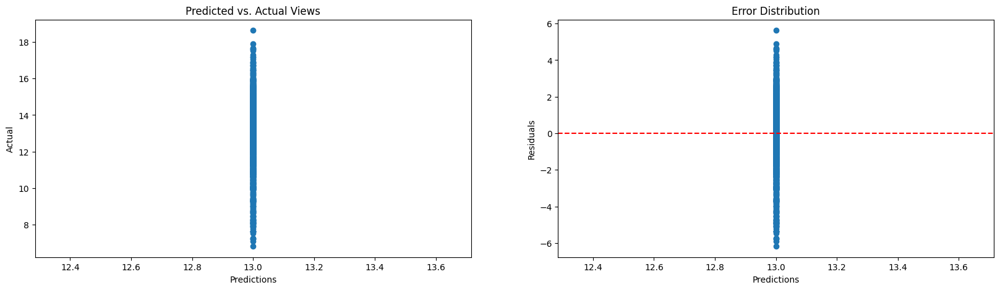

In [ ]:
# Create dummy baseline model that just predicts the mean target value
dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(X_train, y_train)

# Generate predictions
y_pred = dummy_regr.predict(X_test)

# Evaluate the model and generate the baseline scores
evaluate_model(y_test, y_pred)

Above are the evaluation scores and plots for the dummy regressor model. Note that the errors are vertical, when ideally they would be horizontally distributed at random around the center line. This indicates that this model is not fitted well to the data, which is unsurprising given that it only predicts the mean. Also, the R2 score is close to 0, indicating that this model predicts none of the variance of the target variable.

### Decision Tree Regressor

We chose to focus primarily on tree models for this project because the data exhibited signs of non-linearity, as discussed earlier. The first of these was a decision tree regressor. To try and find the ideal hyperparameters for the decision tree, we used a grid search to find the set of hyperparameters that would minimize the MAE. The hyperparameters included in the search were maximum tree depth, minimum impurity decrease, and the minimum number of samples for a split.

Fitting 2 folds for each of 120 candidates, totalling 240 fits
{'max_depth': 2, 'min_impurity_decrease': 0.0, 'min_samples_split': 4}
-1.4153990114718515
Mean Absolute Error (MAE): 1.3599559552546396
Mean Squared Error (MSE): 3.1379488485004896
Root Mean Squared Error (RMSE): 1.7714256542402478
R^2: 0.05673287298010321

Change from baseline:
MAE: -0.03666730624976977
MSE: -0.1893218064698301
RMSE: -0.05265511561900382
R2 +0.056910117115628434


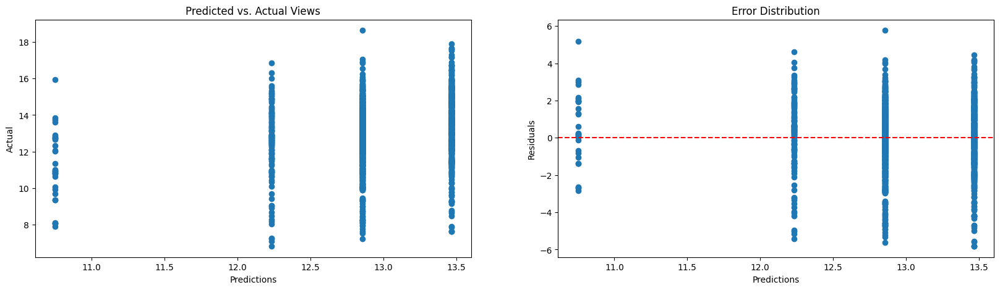

In [ ]:
# Define search parameters for grid search
search_grid = {'max_depth': range(2,8), 'min_impurity_decrease': np.linspace(0,0.5,5), 'min_samples_split': range(2,10,2)}

# Run the grid search for a decision tree regressor using MAE for evaluation
best_dtr = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=search_grid, cv=2, scoring='neg_mean_absolute_error', verbose=1)
best_dtr.fit(X_train, y_train)

# Print the scores and the hyperparameters that achieved the best scores
print(best_dtr.best_params_)
print(best_dtr.best_score_)

# Generate predictions from the model
y_pred = best_dtr.predict(X_test)

# Evaluate the model
evaluate_model(y_test, y_pred)

The evaluation scores and plots show only a small improvement over the baseline scores, indicating that this model is also not a good fit. There is also evidence to suggest that the grid search did not find the optimal hyperparameters, because the second decision tree regressor below with manually found hyperparameters has better performance. This is likely an issue stemming from the dataset being too small, because grid search uses k-fold cross validation to find the hyperparameters that yield the best results and with a small dataset it is possible that the k splits will not be representative of the whole dataset.

Mean Absolute Error (MAE): 1.3453868854548625
Mean Squared Error (MSE): 3.123877579619267
Root Mean Squared Error (RMSE): 1.7674494560295826
R^2: 0.06096269507470409

Change from baseline:
MAE: -0.051236376049546895
MSE: -0.20339307535105267
RMSE: -0.05663131382966902
R2 +0.06113993921022931


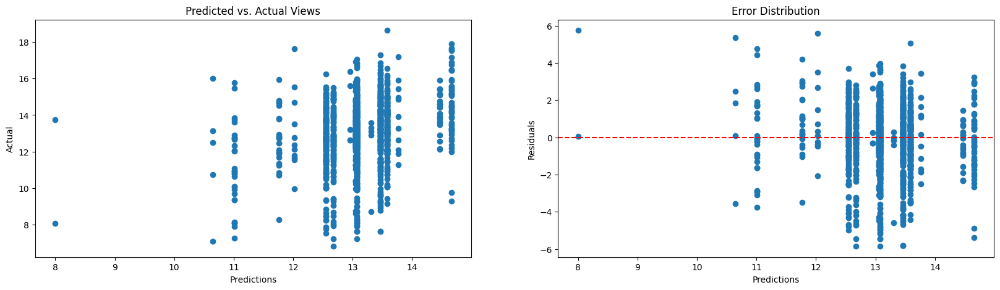

In [ ]:
# Create a new decision tree regressor and manually select hyperparameters
dtr = DecisionTreeRegressor(max_depth=4, criterion='absolute_error', random_state=0)
dtr.fit(X_train, y_train)

# Generate predictions
y_pred = dtr.predict(X_test)

# Evaluate the model
evaluate_model(y_test, y_pred)

The scores and plots are for the second decision tree regressor, which has a larger maximum depth of 4. It also uses absolute error as the criterion for splits instead of the default, which is squared error. It shows a slightly bigger improvement over the baseline than the first decision tree regressor built using the grid search, but still isn't a great fit. The vertical lines that appear on the prediction and error plots correspond to leaf nodes of this tree, indicating that the tree has 16 leaf nodes. Given the complexity of the relationships between the predictor variables and the target, this model is likely to simplistic for the data.

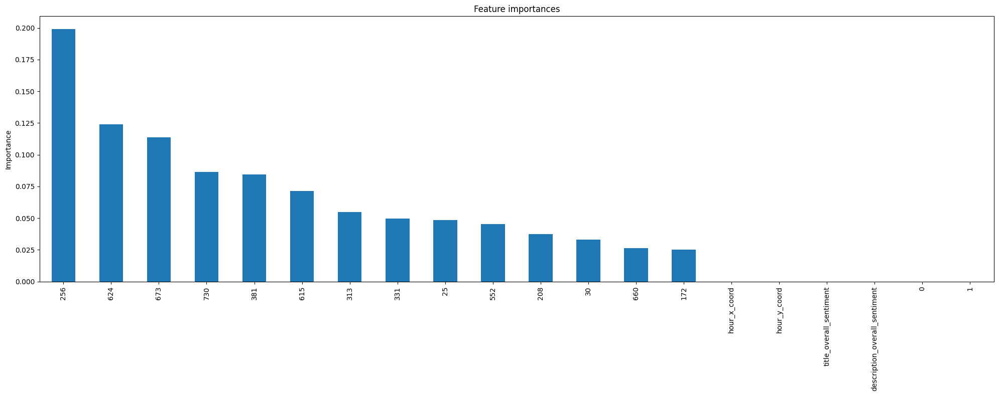

In [ ]:
# Get the feature importances and plot
importances = dtr.feature_importances_
display_feature_importances(importances, n=20)

This plot shows the feature importances for the second decision tree regressor. This particular tree has selected only a small subset of 14 of the features available to it, all of which are text embedding features. This provides further evidence that this model is to simple to capture the complexity of the data.

In [ ]:
# Visualize the tree (hard to read for a maximum depth > 2)
fig, ax = plt.subplots(figsize=(20,10), dpi=2000)
ax = plot_tree(dtr, filled=True, feature_names=list(X_test.columns))
plt.show()

The plot above shows a visualization of the full decision tree regressor. Note that there are 16 leaf nodes, each of which correspond to a vertical stack of points on the prediction and error plots.

### Random Forest Regressor

The next kind of model we tried was a random forest regressor. Random forest regressor models are ensemble methods and can capture much more complexity than a single decision tree. For the first iteration of this model, we built the model with just the default hyperparameters to see which maximum depth would be chosen by the model during training. After doing this, we increased the number of estimators used in the model from the default of 100 to 120.

max_depth: 45
Mean Absolute Error (MAE): 1.1911295780289501
Mean Squared Error (MSE): 2.441131127160306
Root Mean Squared Error (RMSE): 1.5624119582108638
R^2: 0.26619621409836225

Change from baseline:
MAE: -0.20549368347545927
MSE: -0.8861395278100139
RMSE: -0.26166881164838784
R2 +0.2663734582338875


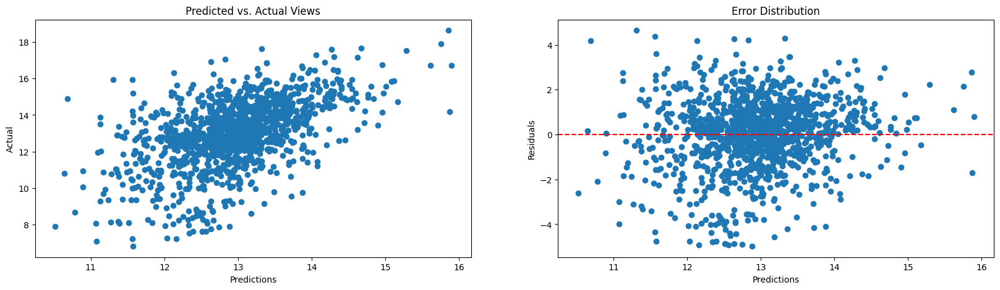

In [ ]:
# Create a random forest regressor, but don't specify a maximum depth to see what
# depth is found in training
rfr = RandomForestRegressor(
    n_estimators=120,
    random_state=0)

# Fit the model
rfr.fit(X_train, y_train)

# Print the maximum tree depth chosen
print(f"max_depth: {max([tree.get_depth() for tree in rfr.estimators_])}")

# Generate predictions and evaluate model
y_pred = rfr.predict(X_test)
evaluate_model(y_test, y_pred)

The maximum tree depth was 45, which is a very deep tree and indicates that some of the trees in the ensemble are fitting to highly irregular patterns, however, the performace of this model was a significant improvement over the baseline and decision tree regressor models. The R2 score in particular indicates that this model explains 26.6% of the variance in the data compared to the previous model which captured only 6% of the variance. The MAE and MSE also decreased by 0.21 and 0.89, respectively, which is significant for the scale of this data (log-scale is relative, not absolute). Looking at the plots, there is a linear relationship present between the predicted and actual values, which is a good sign although there is quite a bit of spread indicating varying accuracy in predictions. The error distribution also shows a horizontally-oriented random scatter of points around the center line, which indicates that this model is a relatively good fit for the data and is not underfitting or overfitting, although the spread is slightly wider for lower values which could indicate the the model is more accurate when predicting larger values.

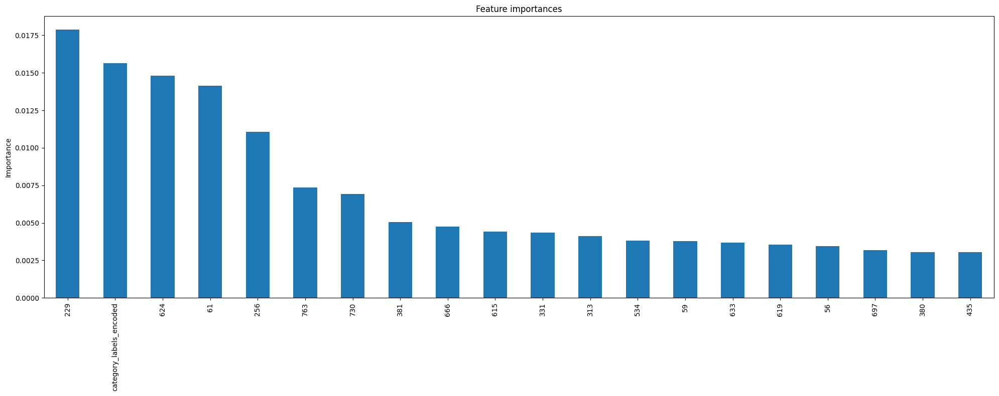

In [ ]:
# Get the feature importances and display
importances = rfr.feature_importances_
display_feature_importances(importances, n=20)

The plot above shows the feature importances for the first random forest regressor model. Comparing these feature importances to the ones for the decision tree regressor, we can see that this model is utilizing far more features in its predictions, which likely explains its superior performance. Note that the top 20 features include the category labels and text features.

To attempt to achieve similar performance with a simpler model, we also tried a random forest regressor with 120 estimators but smaller values for maximum depth. Ultimately, we were able to get similar performance from a model with the maximum depth capped at 30.

Mean Absolute Error (MAE): 1.1896261941636488
Mean Squared Error (MSE): 2.4409672838465872
Root Mean Squared Error (RMSE): 1.5623595245162323
R^2: 0.266245465382967

Change from baseline:
MAE: -0.20699706734076062
MSE: -0.8863033711237325
RMSE: -0.2617212453430193
R2 +0.26642270951849223


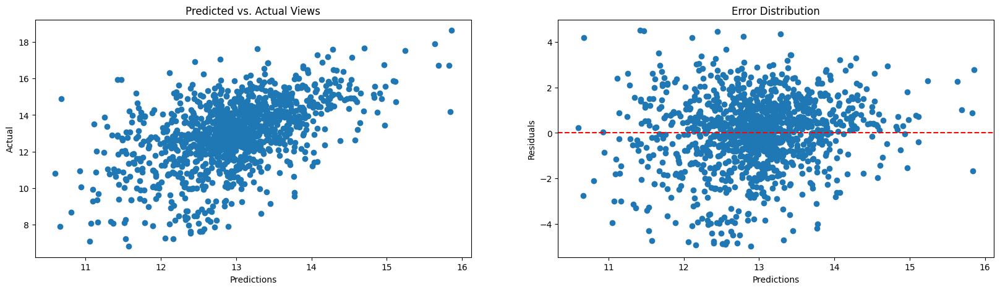

In [ ]:
# Try a random forest regressor with a smaller maximum depth
rfr2 = RandomForestRegressor(
    max_depth=30,
    n_estimators=120,
    random_state=0)

# Fit the model
rfr2.fit(X_train, y_train)

# Generate predictions and evaluate model
y_pred = rfr2.predict(X_test)
evaluate_model(y_test, y_pred)

The evaluation plots for this model show nearly identical behavior to the ones for the first random forest regressor model. The evaluation scores are slightly better than the first random forest regressor model.

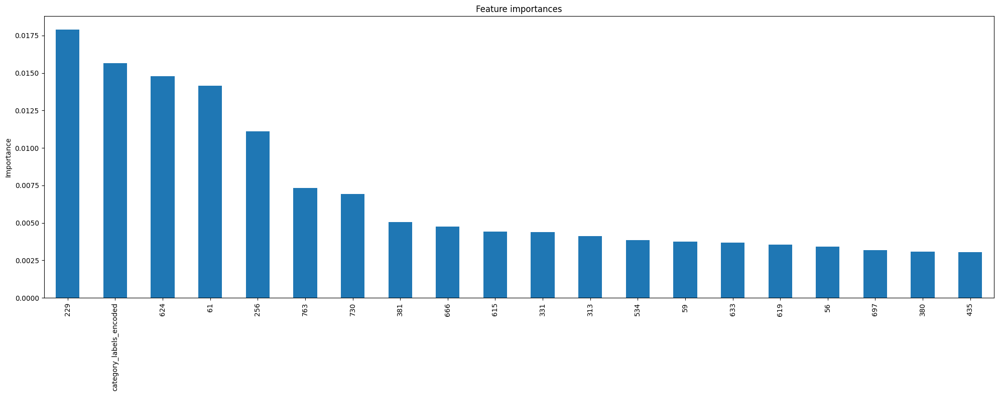

In [ ]:
# Get the feature importances and display
importances = rfr2.feature_importances_
display_feature_importances(importances, n=20)

Above are the feature importances for this model. They are identical to the feature importances for the first random forest regressor model.

### Gradient Boosting Regressor

As an alternative to the random forest regressor, we also tried a gradient boosting regressors. Gradient boosting regressors also use multiple trees to make a prediction, but each tree feeds forward into the next tree instead of using an ensemble of independent trees to make a prediction.

Mean Absolute Error (MAE): 1.2421563235592477
Mean Squared Error (MSE): 2.709860899143281
Root Mean Squared Error (RMSE): 1.6461655138968503
R^2: 0.18541607006120764

Change from baseline:
MAE: -0.15446693794516175
MSE: -0.6174097558270386
RMSE: -0.17791525596240132
R2 +0.18559331419673286


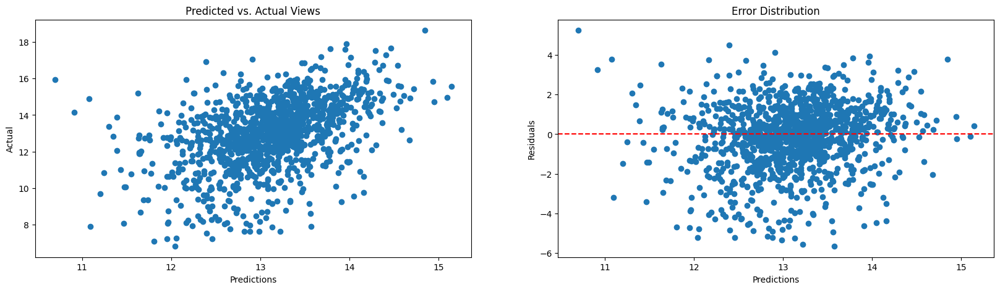

In [ ]:
# Create a gradient boosting regressor using absolute error for loss
gbr = GradientBoostingRegressor(loss='absolute_error', random_state=0)
gbr.fit(X_train, y_train)

# Generate predictions
y_pred = gbr.predict(X_test)

# Evaluate the model
evaluate_model(y_test, y_pred)

Based on the evaluation scores and plots, this model performs worse than the random forest regressor models across every metric so we decided not to move forward with it. One noteable observation, however, is that the spread of errors is more symmetrical than the errors for the random forest regressor models, indicating that the accuracy of predictions is roughly the same across the entire range of values.

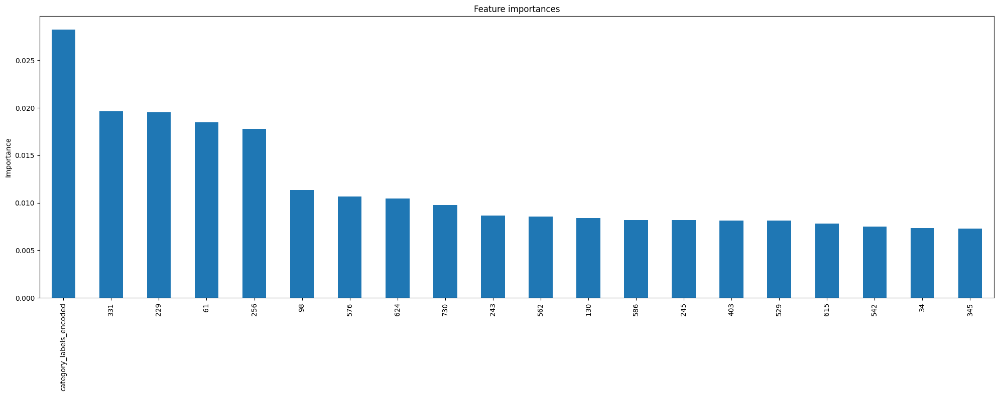

In [ ]:
# Get the feature importances and display
importances = gbr.feature_importances_
display_feature_importances(importances, n=20)

Above are the feature importances for the gradient boosting regressor. Note that this model also chose the category labels and some of text embedding features as the most important.

### Support Vector Regressor

We wanted to explore the possibility of using a non-tree model, so we tried using a support vector regressor. Support vector regression is an extension of the support vector machine algorithm and is well suited to data that is non-linear or has complex relationships. We tried using 3 different kernels functions - rbf (radial basis function), linear, and polynomial. We ultimately ended up using the 2 degree polynomial kernel because the rbf kernel did not fit the data well and the linear kernel failed to converge.

Mean Absolute Error (MAE): 1.3625402748008502
Mean Squared Error (MSE): 3.194143423660121
Root Mean Squared Error (RMSE): 1.7872166694780243
R^2: 0.03984078900293475

Change from baseline:
MAE: -0.03408298670355925
MSE: -0.13312723131019855
RMSE: -0.03686410038122734
R2 +0.040018033138459974


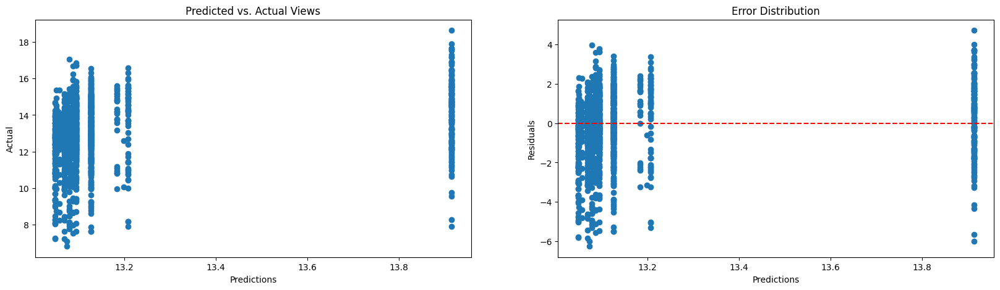

In [ ]:
# Create a support vector regressor using a polynomial kernel function
# NOTE: linear kernel does not seem to converge
svr = SVR(kernel='poly', degree=2)
svr.fit(X_train, y_train)

# Generate predictions
y_pred = svr.predict(X_test)

# Evaluate the model
evaluate_model(y_test, y_pred)

This model had the worst performance of all the models (excluding the dummy model) and did not fit the data well, so we did not move forward with it.

## Discussion and Conclusions

Overall, the random forest regressor model showed promise in being able to predict the views a new video will get in the long run with some accuracy, but there is much room for improvement. The MAE, MSE, and RMSE showed reasonable performance based on the scale of the log-transformed data, but the R2 score indicates that only 26.6% of the variance of the target variable is captured, meaning that 73.4% of variance is not captured. Our suspicion, based on evidence that the random forest regressor algorithm is a good fit for this dataset, is that the relationships between the predictor variables and the views are both weak and complex, meaning that more examples are needed for the model to effectively learn these relationships. We recommend not just collecting more samples, but also expanding the variables in the raw dataset to include other attributes of the video that could influence views, such as the video length, how popular the creator of the video is (subscriber count), and how active the creator is on YouTube. Adding more samples to the dataset would also open up the option to use deep learning models, as the dataset is too small at present to use with a neural network. Another limitation of the dataset is that all the videos in it were trending on YouTube at one point, which may make the data non-representative of videos that never trended. In order to be able to accurately predict the views for any video, the data should also represent videos that did not trend.

Additionally, many of the variables we did have available did not end up being useful for the model to make predictions. Whether comments or ratings were disabled on the video had practically no effect on views, and the upload time and sentiment intensity of the title and description had a limited effect. It is clear that the category of a video and its title and description were the most important factors in determining how many views a video would get. We know from our exploratory data analysis that the categories that got the most views were Music and Entertainment, with Shows, Education, and News & Politics videos receiving the lowest views. It is less clear what specific attributes of the titles and description were the most influential. Not all of the features extracted from the text are equally important, so more analysis could be done to determine which features of the text are the most important for prediction. This would be especially useful for being able to provide specific insights to content creators on what changes they could make to a video title or description to get more views. It is not a straightforward process to perform this kind of analysis, however, because the features extracted by BERT may not be interpretable or have clear semantic meaning. More research is needed in this area.

Our final recommendation is that using machine learning to predict YouTube video views as a function of video metadata is a viable approach using a random forest model or potentially a neural network, but more data needs to be collected to be able to effectively model the complex relationships between the video attributes and its views.

## Sources

GMI Blogger. (2024, June 18). YouTube statistics 2024 [users by country + demographics]. Official GMI Blog. https://www.globalmediainsight.com/blog/youtube-users-statistics/#Daily_Active_Users_on_YouTube

  McCormick, C. (2019, May 14). BERT Word Embeddings Tutorial. https://mccormickml.com/2019/05/14/BERT-word-embeddings-tutorial/



## Appendix

### YouTube Data API Experiments


Early on in the project it became apparent that many of the features in the raw dataset would not be useful for modeling, so we decided to try using YouTube's Data API to retrieve more information that could be used to supplement our dataset. Since the goal of this project is to predict views for *any* new YouTube video, the channel title variable was not useful to us because it ties views to a specific creator and does not generalize, however, it can be used to retrieve information about a specific channel such as the number of subscribers that channel has and how many videos that channel has posted. We theorized that we could use this information as a proxy for creator popularity and creator activity, which are variables that would generalize to any creator and possibly provide meaningful information for the model. We attempted to use the Data API to look up every channel in the dataset and retrieve the subscriber count and video count for each channel, but unfortunately most of the channel titles in the dataset did not match the data accessed by the API and returned no results. To attempt to get around this, we instead tried searching for the ID associated with each channel and using this ID to retrieve the subscriber count and video count but the YouTube Search endpoint has strict quota limits which were incompatible with the size of our dataset, so we ended up not using this code in our project.

In [ ]:
# Since channel title is not useful by itself, we will attempt to use YouTube's
# API to get the subscriber count for each channel as a measure of channel
# popularity, which is a generalizable concept. We will also use video count as
# a measure of creator activity

# Set up credentials
# NOTE: Disable OAuthlib's HTTPS verification when running locally.
# *DO NOT* leave this option enabled in production.
os.environ["OAUTHLIB_INSECURE_TRANSPORT"] = "1"

api_service_name = "youtube"
api_version = "v3"
developer_key = userdata.get('YOUTUBE-API-KEY')
scopes = ["https://www.googleapis.com/auth/youtube.readonly"]

youtube = googleapiclient.discovery.build(
    api_service_name, api_version, developerKey=developer_key)

# Try getting results for just one channel
# The quota cost of this call is 1 unit
request = youtube.channels().list(
    part="statistics",
    forUsername="LastWeekTonight"
)
# Extract values from the JSON response
response = request.execute()
print(response['items'][0]['statistics'])

In [ ]:
# Create an object to store the statistics for each channel
channel_statistics = {}

# Get list of unique channel names
channel_names = list(youtube_df['channel_title'].unique())

for channel in channel_names:
  # Send request for each channel
  request = youtube.channels().list(
      part="statistics",
      forUsername=channel
  )

  # Extract values from the JSON response and add to the statistics dictionary
  response = request.execute()

  if response['pageInfo']['totalResults'] > 0:
    subscriber_count = response['items'][0]['statistics']['subscriberCount']
    video_count = response['items'][0]['statistics']['videoCount']
    channel_statistics[channel] = {'subscriber_count': subscriber_count, 'video_count': video_count}
  else:
    channel_statistics[channel] = {'subscriber_count': np.nan, 'video_count': np.nan}

In [ ]:
# The quota cost of this call is 100 units
request = youtube.search().list(
      part="snippet",
      q="LastWeekTonight",
      type="channel",
      maxResults=1,
  )
response = request.execute()
print(response)
print(response['items'][0]['snippet'])

In [ ]:
# Try getting channel ids instead
found = 0
for channel in channel_names:
  channel_cleaned = ''.join(channel.lower().split())
  request = youtube.search().list(
      part="snippet",
      q=channel_cleaned,
      type="channel",
      maxResults=1,
  )
  response = request.execute()

  if response['pageInfo']['totalResults'] > 0:
    result = response['items'][0]['snippet']['title']
    result_cleaned = ''.join(result.lower().split())
    if channel_cleaned == result_cleaned:
      channel_id = response['items'][0]['id']['channelId']
      found += 1

print("found ", found)
print("not found ", len(channel_names) - found)

In [ ]:
# Cache results to file
with open("channel_statistics.json", "w") as outfile:
    json.dump(channel_statistics, outfile)

In [ ]:
# Load channel statistics into a dataframe for analysis
df = pd.DataFrame.from_dict(channel_statistics, orient='index')
df.info(verbose=True)